## Import libraries

In [89]:
import pandas as pd
import numpy as np
import boto3
from io import BytesIO
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point
from libpysal.weights import KNN
from pysal.explore import esda

In [90]:
#Librerias basicas para regresiones 
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
import statsmodels.stats.diagnostic as smd
import warnings
warnings.filterwarnings('ignore')
#Librerias basicas para proyecciones
from statsmodels.tsa.api import SimpleExpSmoothing
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore', ConvergenceWarning)
from statsmodels.tsa.api import Holt
from statsmodels.tsa.holtwinters.model import ExponentialSmoothing


import geopandas as gpd
import pysal
import numpy as np

## Clean Data Frame

In [91]:
s3_client = boto3.client('s3')

bucket_name = 'data-construccion-costa-rica'  
object_key = 'construcciones_costa_rica_2012_2022.xlsx' 

response = s3_client.get_object(Bucket=bucket_name, Key=object_key)
content = response['Body'].read()

# Now use BytesIO to read the byte content into a DataFrame
data = BytesIO(content)
df = pd.read_excel(data, engine='openpyxl') 

In [92]:
# Remove the column 'Unnamed: 10'
df = df.drop('Unnamed: 10', axis=1)

# Remove rows where 'canton' is 'Costa Rica'
df = df[df['canton'] != 'COSTA RICA']

# Remove rows where 'canton' is 'Río Cuarto'
df = df[df['canton'] != 'Río Cuarto']

In [93]:
# Select rows from 0 to 81
selected_rows_df = df['canton'].loc[0:81]
cantones = selected_rows_df.values.tolist()

In [94]:
def format_name(name):
    return ' '.join([word.title() for word in str(name).split()])

In [95]:
df['canton'] = df['canton'].apply(lambda x: format_name(x))

In [96]:
## Change canton names to correct ones

original = ['San Jose', 'Escazu', 'Tarrazu', 'Aserri', 'Vasquez De Coronado',
            'Tibas', 'Moravia', 'Perez Zeledon', 'Leon Cortes', 'San Ramon','San  Mateo',
            'Poas', 'Paraiso', 'La Union', 'Jimenez', 'Santa Barbara','San  Rafael', 'Belen',
            'Sarapiqui', 'Tilaran', 'Aguirre', 'Limon', 'Pococi', 'Guacimo']

# Corrected names
corrected = ['San José', 'Escazú', 'Tarrazú', 'Aserrí', 'Vázquez De Coronado',
             'Tibás', 'Moravia', 'Pérez Zeledón', 'León Cortés', 'San Ramón','San Mateo',
             'Poás', 'Paraíso', 'La Unión', 'Jiménez', 'Santa Bárbara','San Rafael', 'Belén',
             'Sarapiquí', 'Tilarán', 'Quepos', 'Limón', 'Pococí', 'Guácimo']

# Create a dictionary for mapping
name_mapping = dict(zip(original, corrected))

df['canton'] = df['canton'].map(name_mapping).fillna(df['canton'])

In [97]:
df['canton'].unique()

array(['San José', 'Escazú', 'Desamparados', 'Puriscal', 'Tarrazú',
       'Aserrí', 'Mora', 'Goicoechea', 'Santa Ana', 'Alajuelita',
       'Vázquez De Coronado', 'Acosta', 'Tibás', 'Moravia',
       'Montes De Oca', 'Turrubares', 'Dota', 'Curridabat',
       'Pérez Zeledón', 'León Cortés', 'Alajuela', 'San Ramón', 'Grecia',
       'San Mateo', 'Atenas', 'Naranjo', 'Palmares', 'Poás', 'Orotina',
       'San Carlos', 'Zarcero', 'Valverde Vega', 'Upala', 'Los Chiles',
       'Guatuso', 'Cartago', 'Paraíso', 'La Unión', 'Jiménez',
       'Turrialba', 'Alvarado', 'Oreamuno', 'El Guarco', 'Heredia',
       'Barva', 'Santo Domingo', 'Santa Bárbara', 'San Rafael',
       'San Isidro', 'Belén', 'Flores', 'San Pablo', 'Sarapiquí',
       'Liberia', 'Nicoya', 'Santa Cruz', 'Bagaces', 'Carrillo', 'Cañas',
       'Abangares', 'Tilarán', 'Nandayure', 'La Cruz', 'Hojancha',
       'Puntarenas', 'Esparza', 'Buenos Aires', 'Montes De Oro', 'Osa',
       'Quepos', 'Golfito', 'Coto Brus', 'Parrita', 'C

In [98]:
df

,canton,numero_de_obras_en_construccion_total,area_total,valor_total,numero_de_obras_en_construccion_residenciales,Area_residencales,valor_residenciales,numero_de_obras_en_construccion_noresidenciales,area_de_obras_en_construccion_noresidenciales,valor_no_residenciales,anno
0,San José,606,120630,4.263994e+07,463,68106,2.537038e+07,46,52524,15693968.03,2022
1,Escazú,818,232633,9.425034e+07,543,165440,6.658117e+07,74,67193,20393468.925,2022
2,Desamparados,256,17503,5.230944e+06,144,12604,3.709363e+06,28,4899,1131499.094,2022
3,Puriscal,267,15235,4.208677e+06,194,13994,3.720781e+06,24,1241,244072.991,2022
4,Tarrazú,168,9666,2.811351e+06,94,6774,1.812307e+06,18,2892,766577.427,2022
...,...,...,...,...,...,...,...,...,...,...,...
891,Pococí,1031,65078,1.247820e+07,931,52072,1.013687e+07,72,13006,2107394,2012
892,Siquirres,175,31983,3.230378e+06,157,8997,1.744811e+06,13,22986,1431972,2012
893,Talamanca,234,14106,2.347364e+06,205,11277,1.753735e+06,21,2829,542552,2012
894,Matina,110,7286,1.247714e+06,92,4254,7.354300e+05,12,3032,505765,2012


In [99]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 891 entries, 0 to 895
Data columns (total 11 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   canton                                           891 non-null    object 
 1   numero_de_obras_en_construccion_total            891 non-null    int64  
 2   area_total                                       891 non-null    int64  
 3   valor_total                                      891 non-null    float64
 4   numero_de_obras_en_construccion_residenciales    891 non-null    int64  
 5   Area_residencales                                891 non-null    int64  
 6   valor_residenciales                              891 non-null    float64
 7   numero_de_obras_en_construccion_noresidenciales  891 non-null    object 
 8   area_de_obras_en_construccion_noresidenciales    891 non-null    object 
 9   valor_no_residenciales               

In [100]:
numeric_columns = ['numero_de_obras_en_construccion_noresidenciales', 'area_de_obras_en_construccion_noresidenciales', 'valor_no_residenciales']
df[numeric_columns] = df[numeric_columns].apply(pd.to_numeric, errors='coerce')


In [101]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 891 entries, 0 to 895
Data columns (total 11 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   canton                                           891 non-null    object 
 1   numero_de_obras_en_construccion_total            891 non-null    int64  
 2   area_total                                       891 non-null    int64  
 3   valor_total                                      891 non-null    float64
 4   numero_de_obras_en_construccion_residenciales    891 non-null    int64  
 5   Area_residencales                                891 non-null    int64  
 6   valor_residenciales                              891 non-null    float64
 7   numero_de_obras_en_construccion_noresidenciales  890 non-null    float64
 8   area_de_obras_en_construccion_noresidenciales    890 non-null    float64
 9   valor_no_residenciales               

In [102]:
s3_client = boto3.client('s3')
bucket_name1 = 'data-construccion-costa-rica'  
object_key1 = 'Coordenadas_cantones.xlsx' 

response1 = s3_client.get_object(Bucket=bucket_name1, Key=object_key1)
content1 = response1['Body'].read()

# Now use BytesIO to read the byte content into a DataFrame
data1 = BytesIO(content1)
df1 = pd.read_excel(data1, engine='openpyxl') 

In [103]:
df1

,canton,latitud_wgs84,longitud_wsg84
0,San José,9.934138,-84.073059
1,Escazú,9.919695,-84.140285
2,Desamparados,9.898578,-84.065009
3,Puriscal,9.846364,-84.315837
4,Tarrazú,9.659712,-84.022234
...,...,...,...
77,Pococí,10.209112,-83.790010
78,Siquirres,10.096901,-83.506948
79,Talamanca,9.624982,-82.851955
80,Matina,10.076067,-83.291678


In [104]:
df2 = df.merge(df1, on='canton', how='left')

In [105]:
df2

,canton,numero_de_obras_en_construccion_total,area_total,valor_total,numero_de_obras_en_construccion_residenciales,Area_residencales,valor_residenciales,numero_de_obras_en_construccion_noresidenciales,area_de_obras_en_construccion_noresidenciales,valor_no_residenciales,anno,latitud_wgs84,longitud_wsg84
0,San José,606,120630,4.263994e+07,463,68106,2.537038e+07,46.0,52524.0,1.569397e+07,2022,9.934138,-84.073059
1,Escazú,818,232633,9.425034e+07,543,165440,6.658117e+07,74.0,67193.0,2.039347e+07,2022,9.919695,-84.140285
2,Desamparados,256,17503,5.230944e+06,144,12604,3.709363e+06,28.0,4899.0,1.131499e+06,2022,9.898578,-84.065009
3,Puriscal,267,15235,4.208677e+06,194,13994,3.720781e+06,24.0,1241.0,2.440730e+05,2022,9.846364,-84.315837
4,Tarrazú,168,9666,2.811351e+06,94,6774,1.812307e+06,18.0,2892.0,7.665774e+05,2022,9.659712,-84.022234
...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,Pococí,1031,65078,1.247820e+07,931,52072,1.013687e+07,72.0,13006.0,2.107394e+06,2012,10.209112,-83.790010
887,Siquirres,175,31983,3.230378e+06,157,8997,1.744811e+06,13.0,22986.0,1.431972e+06,2012,10.096901,-83.506948
888,Talamanca,234,14106,2.347364e+06,205,11277,1.753735e+06,21.0,2829.0,5.425520e+05,2012,9.624982,-82.851955
889,Matina,110,7286,1.247714e+06,92,4254,7.354300e+05,12.0,3032.0,5.057650e+05,2012,10.076067,-83.291678


In [106]:
s3_client = boto3.client('s3')
bucket_name2 = 'data-construccion-costa-rica'  
object_key2 = 'division_canton.xlsx' 

response2 = s3_client.get_object(Bucket=bucket_name2, Key=object_key2)
content2 = response2['Body'].read()

# Now use BytesIO to read the byte content into a DataFrame
data2 = BytesIO(content2)
df3 = pd.read_excel(data2, engine='openpyxl') 

In [107]:
df3

,canton,gam,urbano
0,San José,1,1
1,Escazú,1,1
2,Desamparados,1,1
3,Puriscal,0,0
4,Tarrazú,0,0
...,...,...,...
76,Pococí,0,0
77,Siquirres,0,0
78,Talamanca,0,0
79,Matina,0,0


In [108]:
df4 = df2.merge(df3, on='canton', how='left')

In [109]:
df4

,canton,numero_de_obras_en_construccion_total,area_total,valor_total,numero_de_obras_en_construccion_residenciales,Area_residencales,valor_residenciales,numero_de_obras_en_construccion_noresidenciales,area_de_obras_en_construccion_noresidenciales,valor_no_residenciales,anno,latitud_wgs84,longitud_wsg84,gam,urbano
0,San José,606,120630,4.263994e+07,463,68106,2.537038e+07,46.0,52524.0,1.569397e+07,2022,9.934138,-84.073059,1.0,1.0
1,Escazú,818,232633,9.425034e+07,543,165440,6.658117e+07,74.0,67193.0,2.039347e+07,2022,9.919695,-84.140285,1.0,1.0
2,Desamparados,256,17503,5.230944e+06,144,12604,3.709363e+06,28.0,4899.0,1.131499e+06,2022,9.898578,-84.065009,1.0,1.0
3,Puriscal,267,15235,4.208677e+06,194,13994,3.720781e+06,24.0,1241.0,2.440730e+05,2022,9.846364,-84.315837,0.0,0.0
4,Tarrazú,168,9666,2.811351e+06,94,6774,1.812307e+06,18.0,2892.0,7.665774e+05,2022,9.659712,-84.022234,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,Pococí,1031,65078,1.247820e+07,931,52072,1.013687e+07,72.0,13006.0,2.107394e+06,2012,10.209112,-83.790010,0.0,0.0
887,Siquirres,175,31983,3.230378e+06,157,8997,1.744811e+06,13.0,22986.0,1.431972e+06,2012,10.096901,-83.506948,0.0,0.0
888,Talamanca,234,14106,2.347364e+06,205,11277,1.753735e+06,21.0,2829.0,5.425520e+05,2012,9.624982,-82.851955,0.0,0.0
889,Matina,110,7286,1.247714e+06,92,4254,7.354300e+05,12.0,3032.0,5.057650e+05,2012,10.076067,-83.291678,0.0,0.0


## EDA 

In [33]:
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="lightblue"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, color = "indianred"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="yellow", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

### Ignorar Anno 

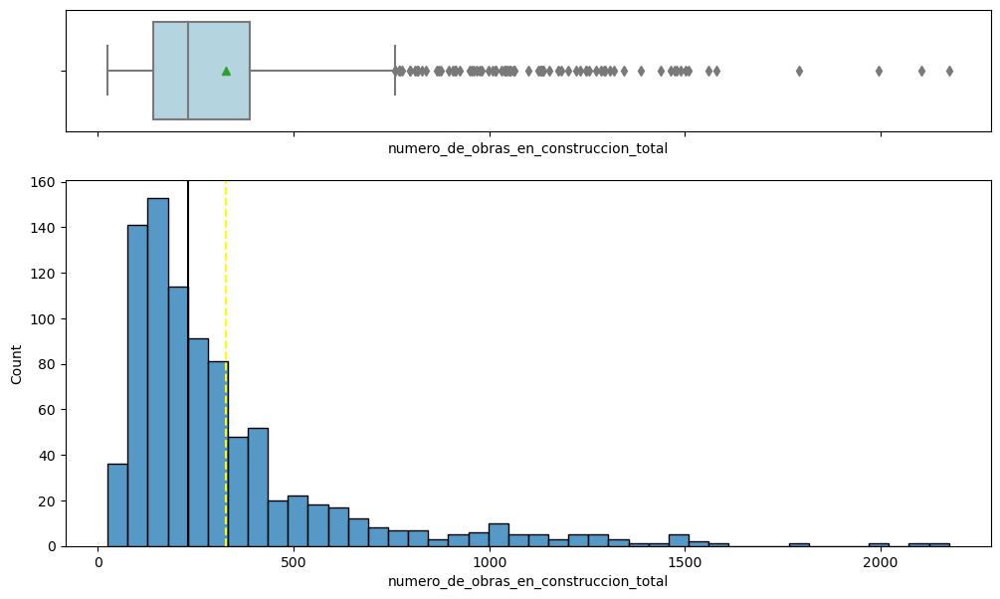

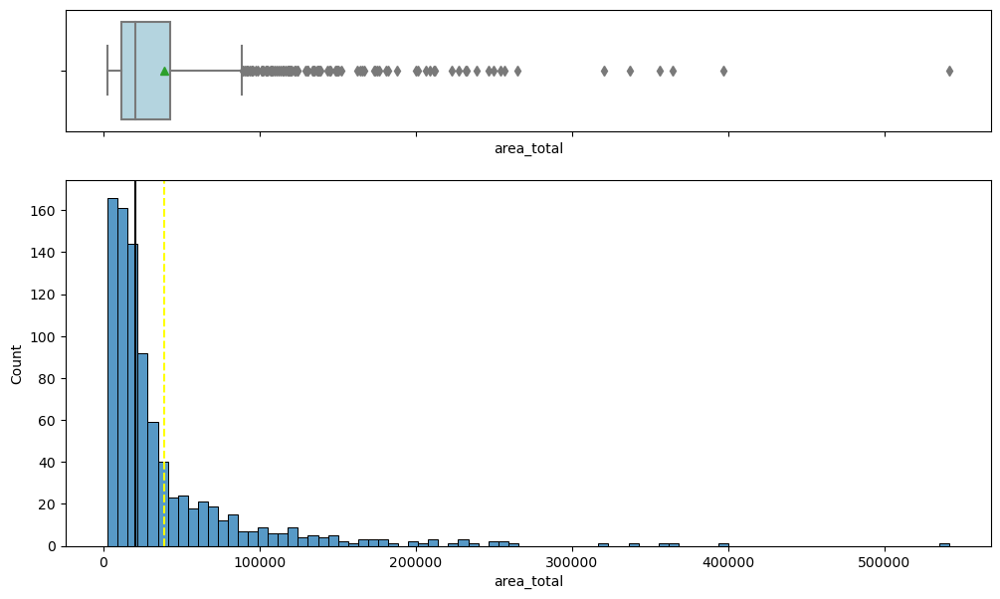

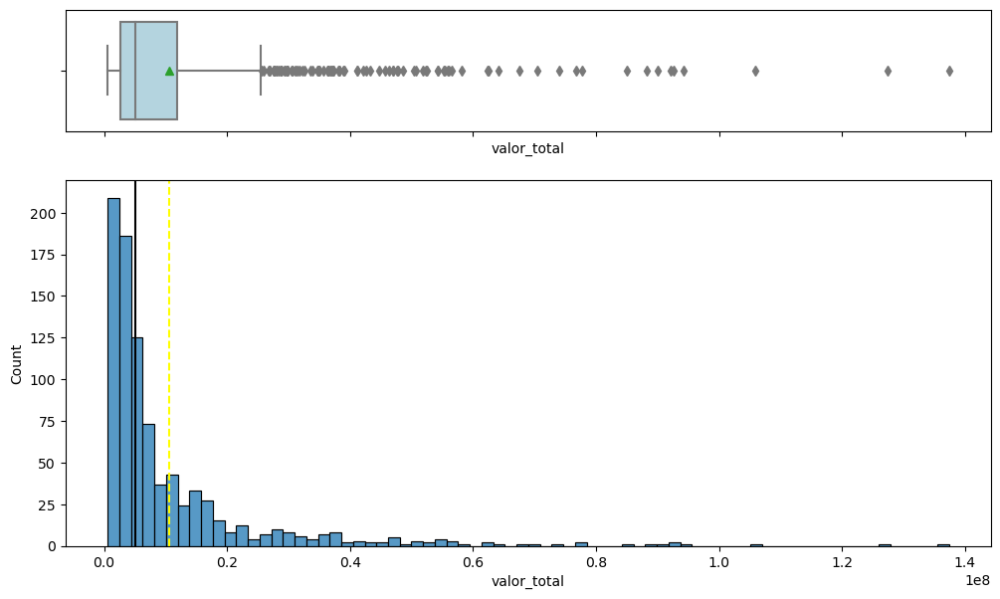

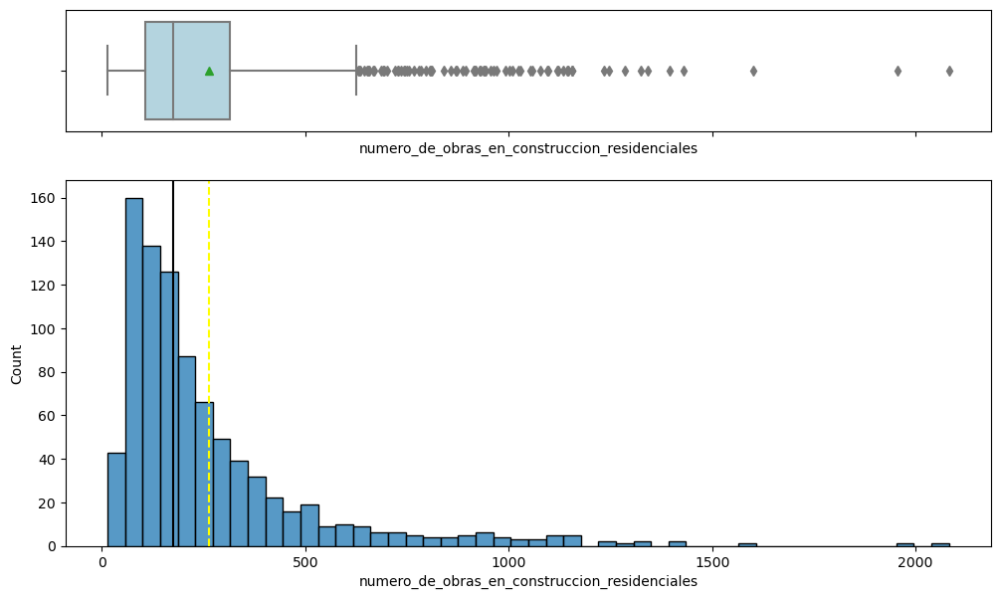

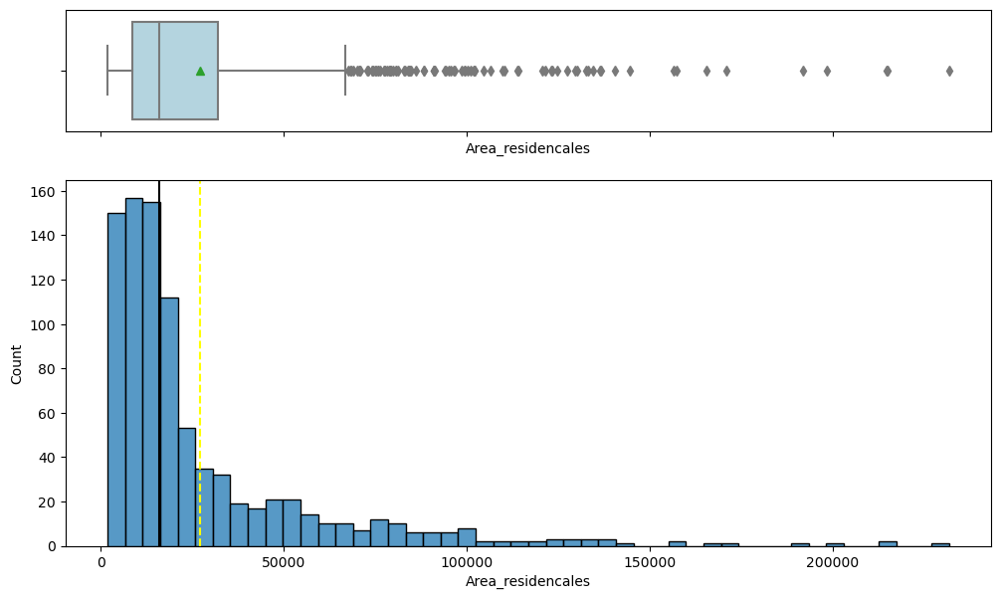

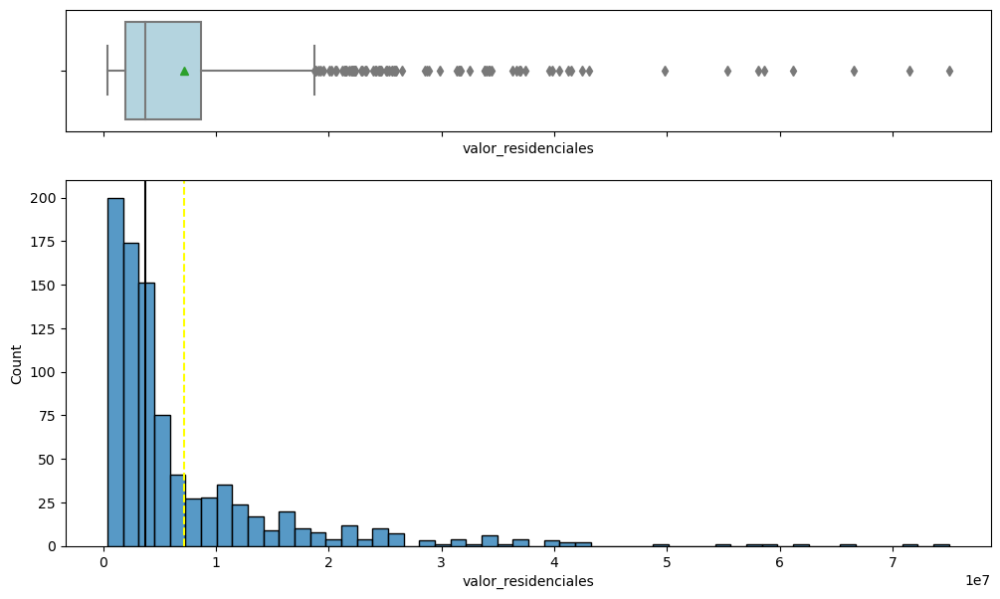

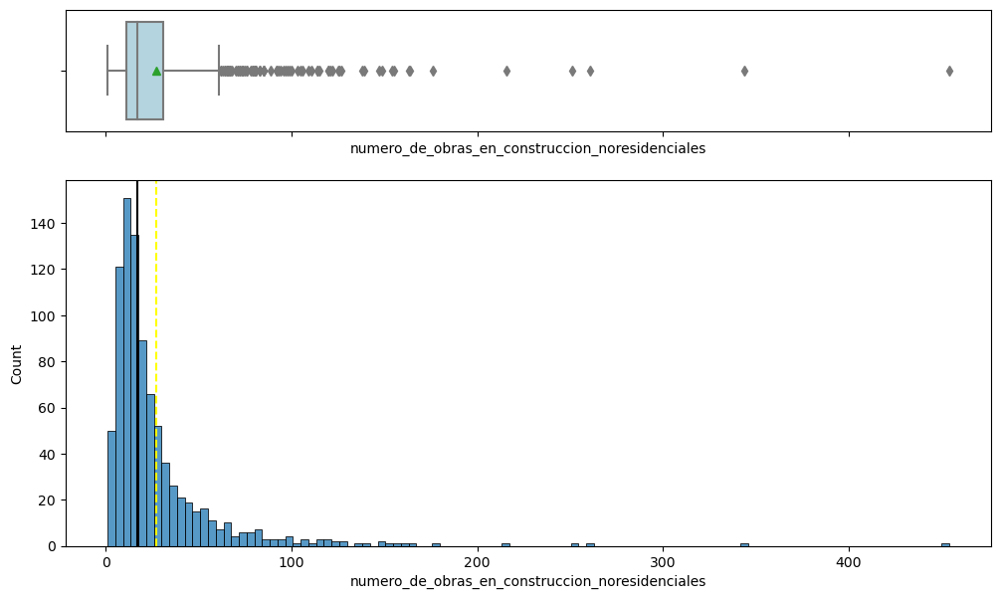

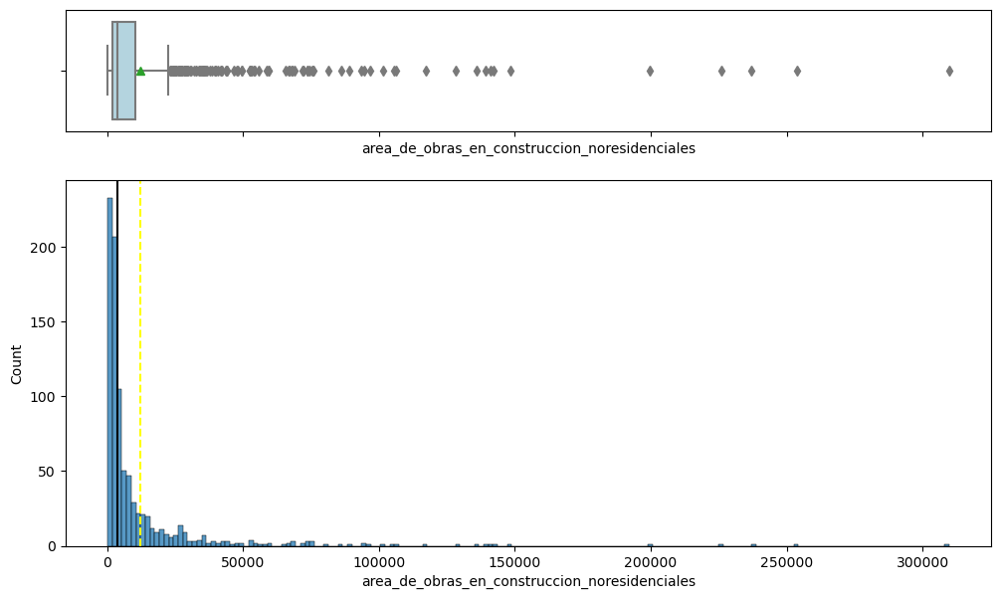

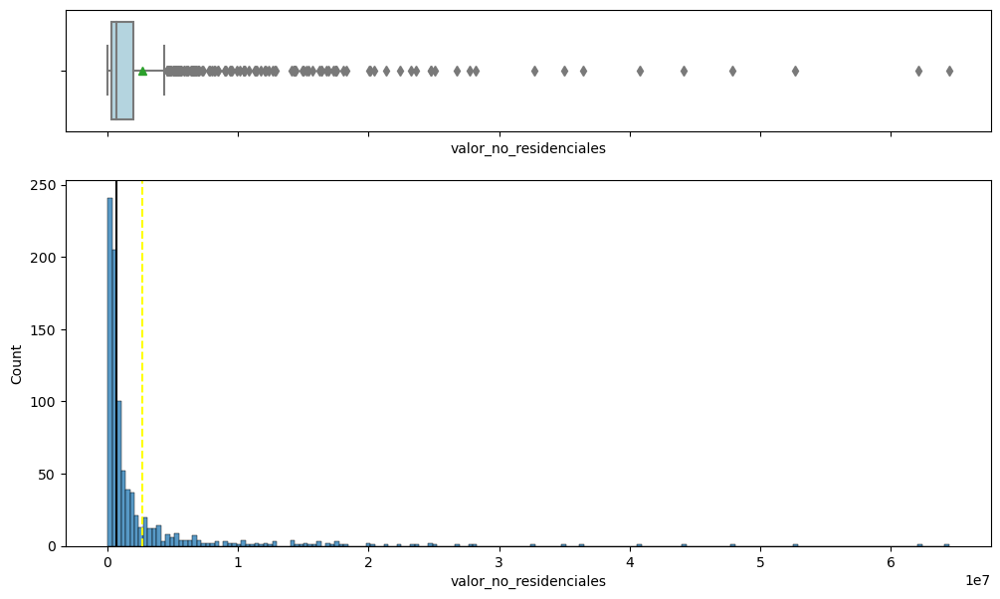

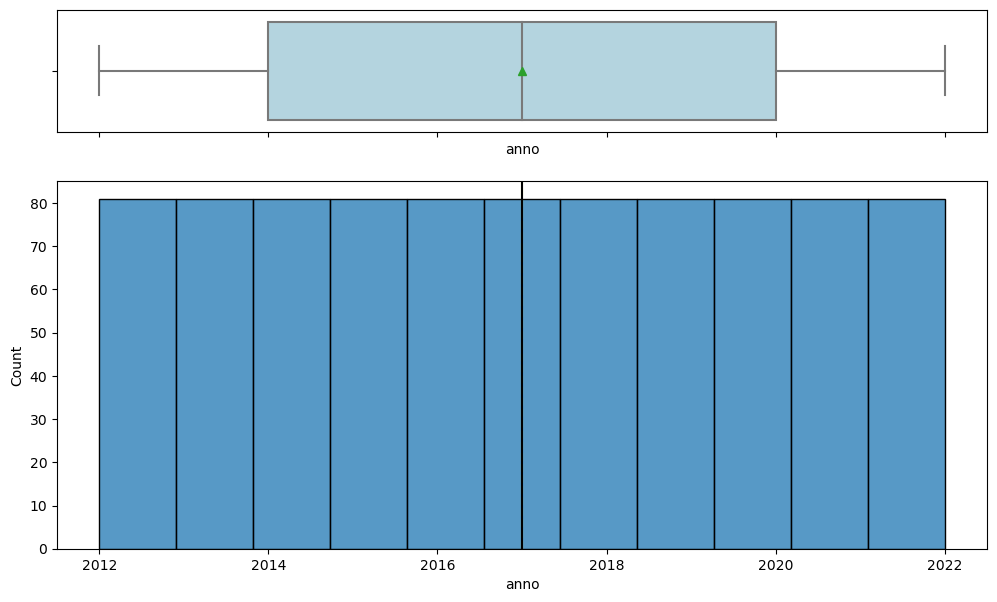

In [34]:
num_col = df.select_dtypes(include=np.number).columns.tolist()

for item in num_col:
    histogram_boxplot(df, item)

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 891 entries, 0 to 895
Data columns (total 11 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   canton                                           891 non-null    object 
 1   numero_de_obras_en_construccion_total            891 non-null    int64  
 2   area_total                                       891 non-null    int64  
 3   valor_total                                      891 non-null    float64
 4   numero_de_obras_en_construccion_residenciales    891 non-null    int64  
 5   Area_residencales                                891 non-null    int64  
 6   valor_residenciales                              891 non-null    float64
 7   numero_de_obras_en_construccion_noresidenciales  890 non-null    float64
 8   area_de_obras_en_construccion_noresidenciales    890 non-null    float64
 9   valor_no_residenciales               

- canton 

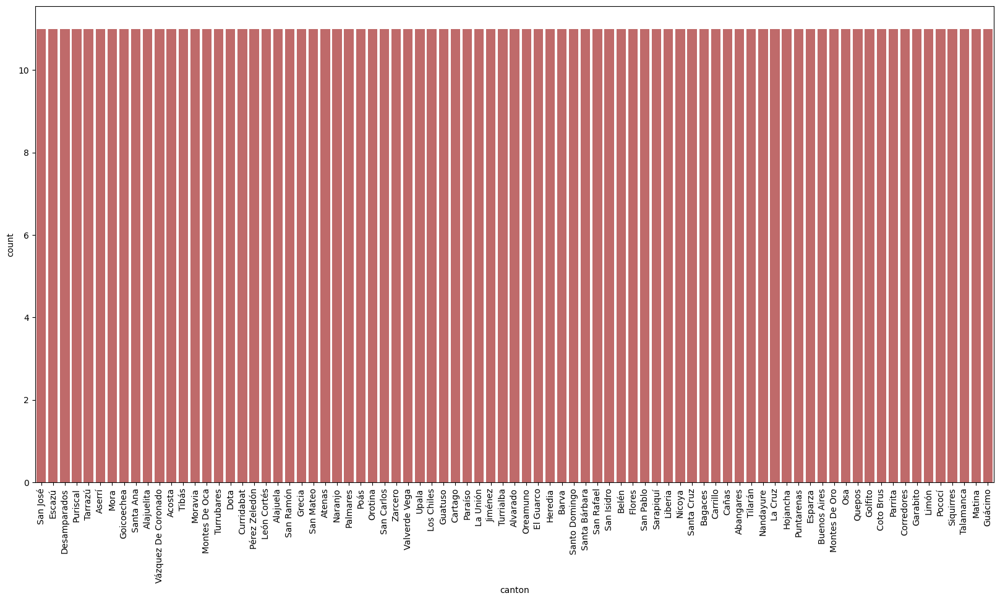

In [36]:
plt.figure(figsize = (20,10))
sns.countplot(data = df, x = "canton", color = "indianred")
plt.xticks(rotation=90)
plt.show()

- numero_de_obras_en_construccion_total 

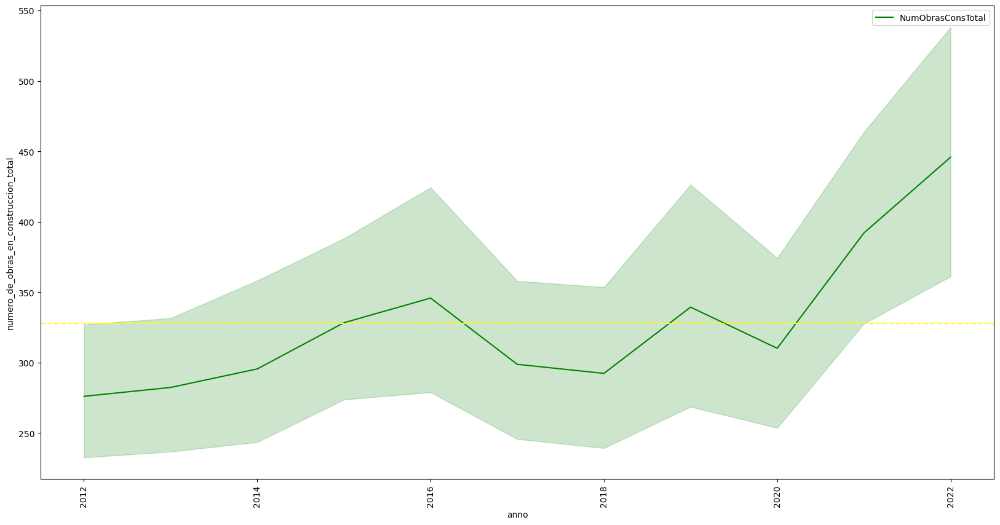

In [37]:
plt.figure(figsize = (20,10))
sns.lineplot(data = df, x = "anno", y = "numero_de_obras_en_construccion_total", color = "green", label = "NumObrasConsTotal")
plt.axhline(y=df["numero_de_obras_en_construccion_total"].mean(),  color="yellow", linestyle = "--", label = "Media")
plt.xticks(rotation=90)
plt.show()

In [110]:
s_t_num_obras_cons_total = pd.DataFrame()
s_t_num_obras_cons_total["numero_de_obras_en_construccion_total"] = df["numero_de_obras_en_construccion_total"]

In [111]:
cf_cycles, cf_trend = sm.tsa.filters.cffilter(s_t_num_obras_cons_total['numero_de_obras_en_construccion_total'])

In [112]:
s_t_num_obras_cons_total["cf_trend"] = cf_trend

In [113]:
s_t_num_obras_cons_total['cf_cycle'] = cf_cycles

s_t_num_obras_cons_total['non_cf_cycle'] = s_t_num_obras_cons_total['numero_de_obras_en_construccion_total'] - s_t_num_obras_cons_total['cf_cycle']

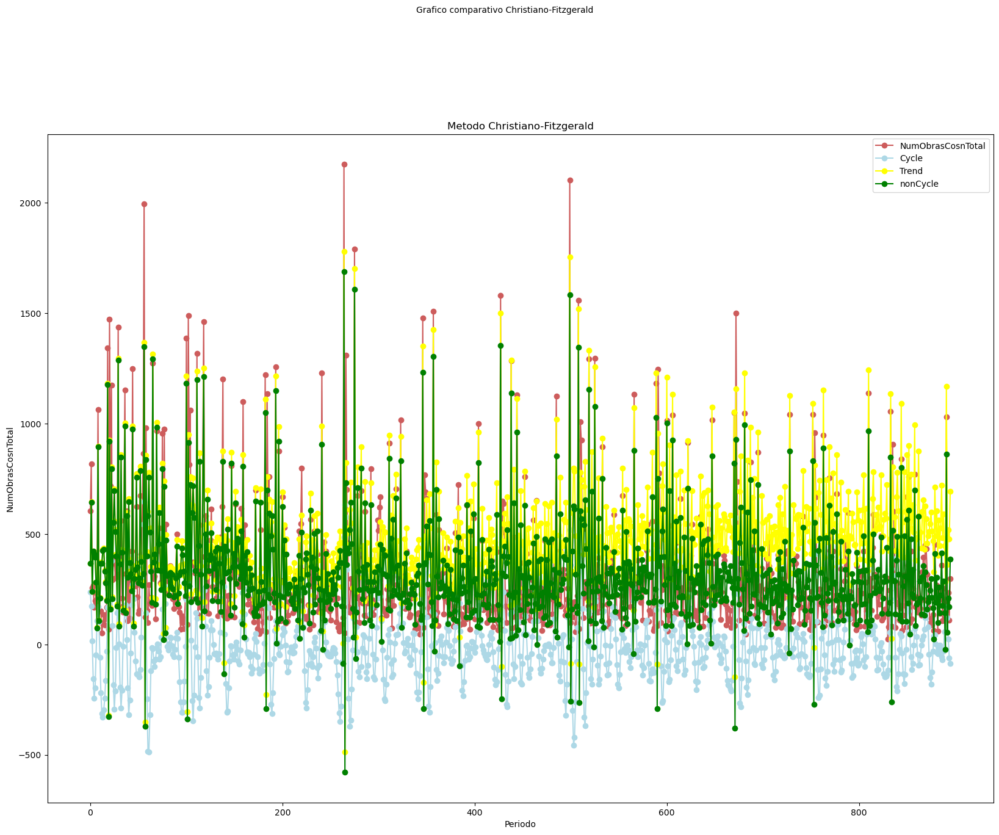

In [114]:

fig, (ax1) = plt.subplots(1,1, figsize = (20,15))
fig.suptitle('Grafico comparativo Christiano-Fitzgerald', fontsize =10)

# simple
ax1.plot(s_t_num_obras_cons_total.index, s_t_num_obras_cons_total['numero_de_obras_en_construccion_total'],
         '-o',  color = 'indianred', label = 'NumObrasCosnTotal')
ax1.plot(s_t_num_obras_cons_total.index, s_t_num_obras_cons_total['cf_cycle'],
         '-o',  color = 'lightblue', label = 'Cycle')
ax1.plot(s_t_num_obras_cons_total.index, s_t_num_obras_cons_total['cf_trend'],
         '-o',  color = 'yellow', label = 'Trend')
ax1.plot(s_t_num_obras_cons_total.index, s_t_num_obras_cons_total["non_cf_cycle"],
         '-o',  color = 'green', label = 'nonCycle')
ax1.set(xlabel= 'Periodo', ylabel= "NumObrasCosnTotal")
ax1.set_title('Metodo Christiano-Fitzgerald')
ax1.legend(loc='best')

plt.subplots_adjust(top=0.84)

plt.show()
     

- area_total

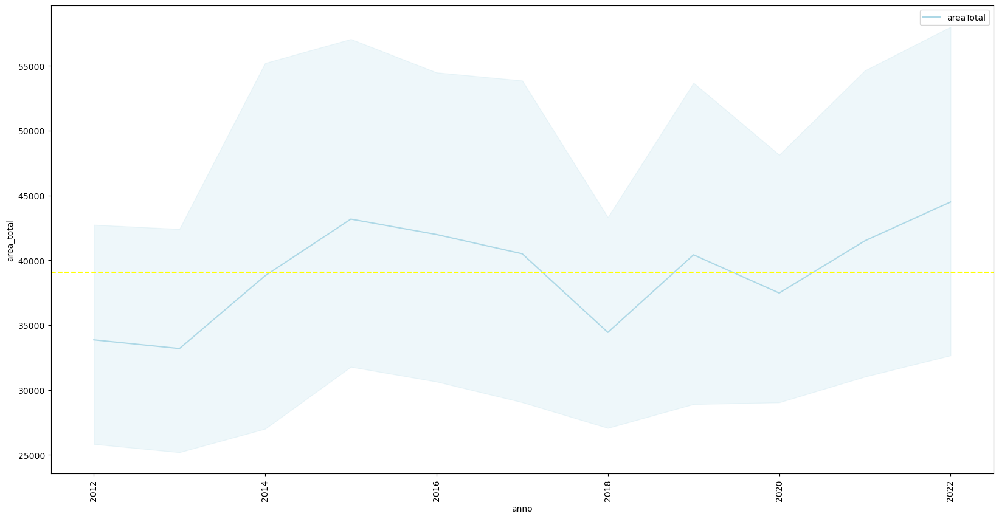

In [156]:
plt.figure(figsize = (20,10))
sns.lineplot(data = df, x = "anno", y = "area_total", color = "lightblue", label = "areaTotal")
plt.axhline(y=df["area_total"].mean(),  color="yellow", linestyle = "--", label = "Media")
plt.xticks(rotation=90)
plt.show()

In [51]:
s_t_area_total = pd.DataFrame()
s_t_area_total["area_total"] = df["area_total"]

In [52]:
cf_cycles, cf_trend = sm.tsa.filters.cffilter(s_t_area_total['area_total'])

In [53]:
s_t_area_total["cf_trend"] = cf_trend
s_t_area_total['cf_cycle'] = cf_cycles
s_t_area_total['non_cf_cycle'] = s_t_area_total['area_total'] - s_t_area_total['cf_cycle']

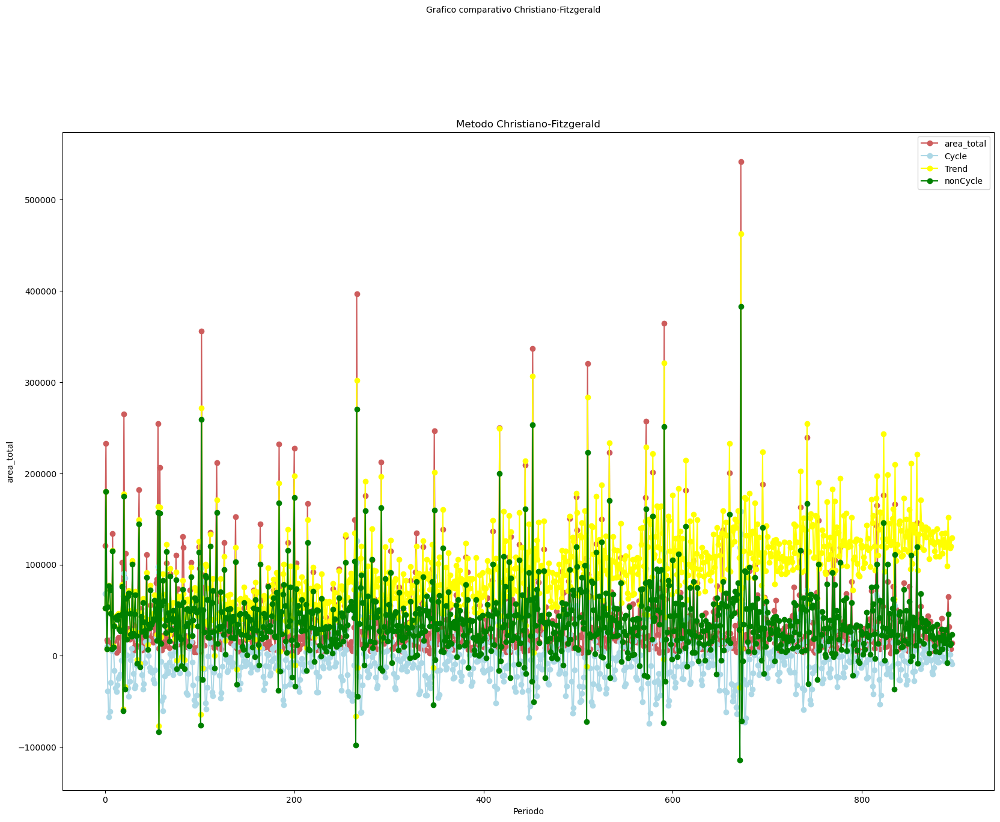

In [55]:

fig, (ax1) = plt.subplots(1,1, figsize = (20,15))
fig.suptitle('Grafico comparativo Christiano-Fitzgerald', fontsize =10)

# simple
ax1.plot(s_t_area_total.index, s_t_area_total['area_total'],
         '-o',  color = 'indianred', label = 'area_total')
ax1.plot(s_t_area_total.index, s_t_area_total['cf_cycle'],
         '-o',  color = 'lightblue', label = 'Cycle')
ax1.plot(s_t_area_total.index, s_t_area_total['cf_trend'],
         '-o',  color = 'yellow', label = 'Trend')
ax1.plot(s_t_area_total.index, s_t_area_total["non_cf_cycle"],
         '-o',  color = 'green', label = 'nonCycle')
ax1.set(xlabel= 'Periodo', ylabel= "area_total")
ax1.set_title('Metodo Christiano-Fitzgerald')
ax1.legend(loc='best')

plt.subplots_adjust(top=0.84)

plt.show()
     

- valor_total

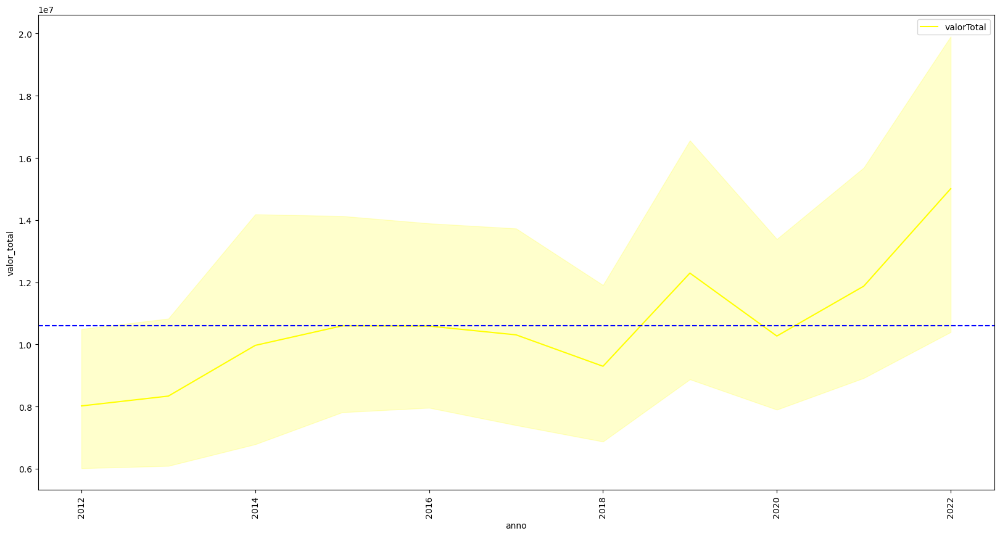

In [157]:
plt.figure(figsize = (20,10))
sns.lineplot(data = df, x = "anno", y = "valor_total", color = "yellow", label = "valorTotal")
plt.axhline(y=df["valor_total"].mean(),  color="blue", linestyle = "--", label = "Media")
plt.xticks(rotation=90)
plt.show()

In [56]:
s_t_valor_total = pd.DataFrame()
s_t_valor_total["valor_total"] = df["valor_total"]

In [57]:
cf_cycles, cf_trend = sm.tsa.filters.cffilter(s_t_valor_total['valor_total'])

In [59]:
s_t_valor_total["cf_trend"] = cf_trend
s_t_valor_total['cf_cycle'] = cf_cycles
s_t_valor_total['non_cf_cycle'] = s_t_valor_total['valor_total'] - s_t_valor_total['cf_cycle']

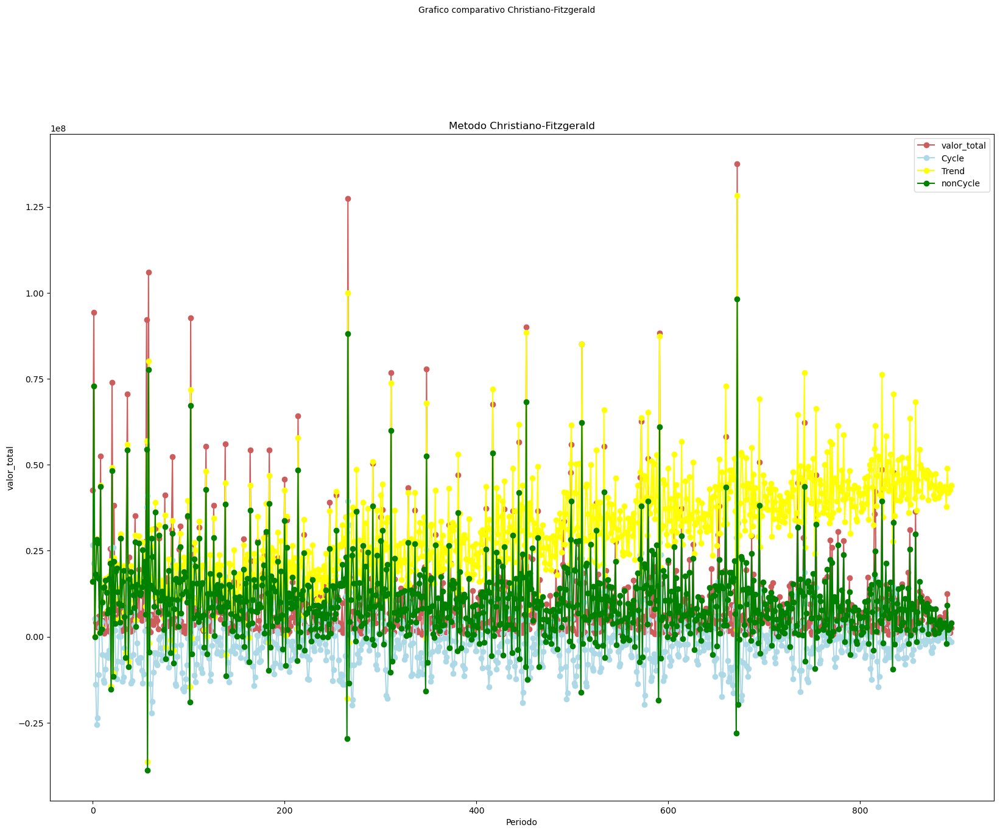

In [61]:

fig, (ax1) = plt.subplots(1,1, figsize = (20,15))
fig.suptitle('Grafico comparativo Christiano-Fitzgerald', fontsize =10)

# simple
ax1.plot(s_t_valor_total.index, s_t_valor_total['valor_total'],
         '-o',  color = 'indianred', label = 'valor_total')
ax1.plot(s_t_valor_total.index, s_t_valor_total['cf_cycle'],
         '-o',  color = 'lightblue', label = 'Cycle')
ax1.plot(s_t_valor_total.index, s_t_valor_total['cf_trend'],
         '-o',  color = 'yellow', label = 'Trend')
ax1.plot(s_t_valor_total.index, s_t_valor_total["non_cf_cycle"],
         '-o',  color = 'green', label = 'nonCycle')
ax1.set(xlabel= 'Periodo', ylabel= "valor_total")
ax1.set_title('Metodo Christiano-Fitzgerald')
ax1.legend(loc='best')

plt.subplots_adjust(top=0.84)

plt.show()
     

- numero_de_obras_en_construccion_residenciales

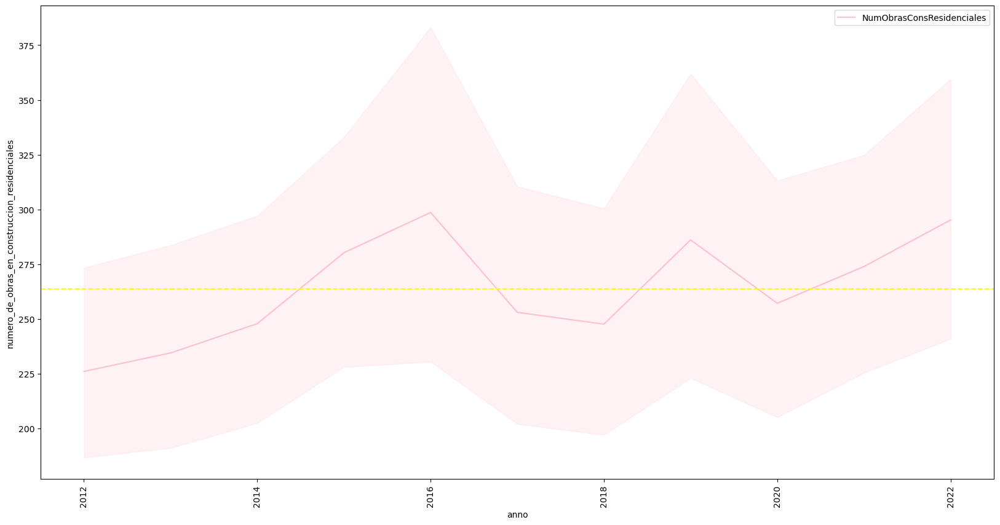

In [158]:
plt.figure(figsize = (20,10))
sns.lineplot(data = df, x = "anno", y = "numero_de_obras_en_construccion_residenciales", color = "pink",
            label = "NumObrasConsResidenciales")
plt.axhline(y=df["numero_de_obras_en_construccion_residenciales"].mean(),  color="yellow", linestyle = "--", label = "Media")
plt.xticks(rotation=90)
plt.show()

In [62]:
s_t_num_obras_cons_residenciales = pd.DataFrame()
s_t_num_obras_cons_residenciales["numero_de_obras_en_construccion_residenciales"] = df["numero_de_obras_en_construccion_residenciales"]

In [63]:
cf_cycles, cf_trend = sm.tsa.filters.cffilter(s_t_num_obras_cons_residenciales['numero_de_obras_en_construccion_residenciales'])

In [64]:
s_t_num_obras_cons_residenciales["cf_trend"] = cf_trend
s_t_num_obras_cons_residenciales['cf_cycle'] = cf_cycles
s_t_num_obras_cons_residenciales['non_cf_cycle'] = s_t_num_obras_cons_residenciales['numero_de_obras_en_construccion_residenciales'] - s_t_num_obras_cons_residenciales['cf_cycle']

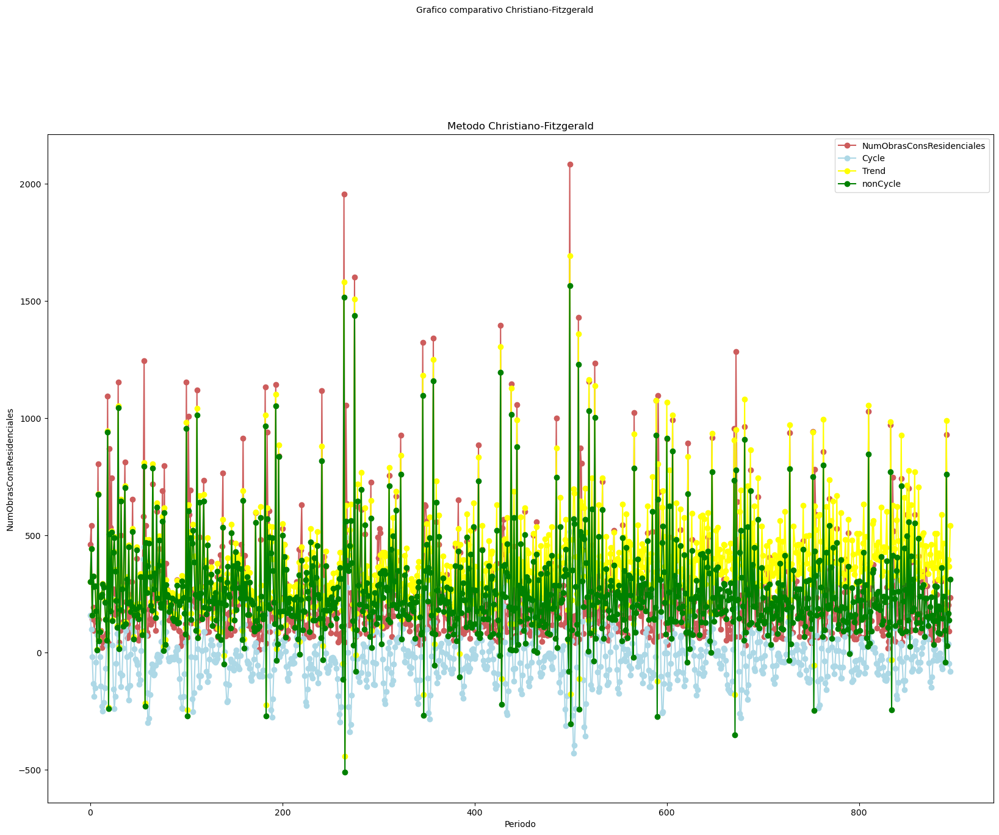

In [65]:

fig, (ax1) = plt.subplots(1,1, figsize = (20,15))
fig.suptitle('Grafico comparativo Christiano-Fitzgerald', fontsize =10)

# simple
ax1.plot(s_t_num_obras_cons_residenciales.index, s_t_num_obras_cons_residenciales['numero_de_obras_en_construccion_residenciales'],
         '-o',  color = 'indianred', label = 'NumObrasConsResidenciales')
ax1.plot(s_t_num_obras_cons_residenciales.index, s_t_num_obras_cons_residenciales['cf_cycle'],
         '-o',  color = 'lightblue', label = 'Cycle')
ax1.plot(s_t_num_obras_cons_residenciales.index, s_t_num_obras_cons_residenciales['cf_trend'],
         '-o',  color = 'yellow', label = 'Trend')
ax1.plot(s_t_num_obras_cons_residenciales.index, s_t_num_obras_cons_residenciales["non_cf_cycle"],
         '-o',  color = 'green', label = 'nonCycle')
ax1.set(xlabel= 'Periodo', ylabel= "NumObrasConsResidenciales")
ax1.set_title('Metodo Christiano-Fitzgerald')
ax1.legend(loc='best')

plt.subplots_adjust(top=0.84)

plt.show()
     

- Area_residencales

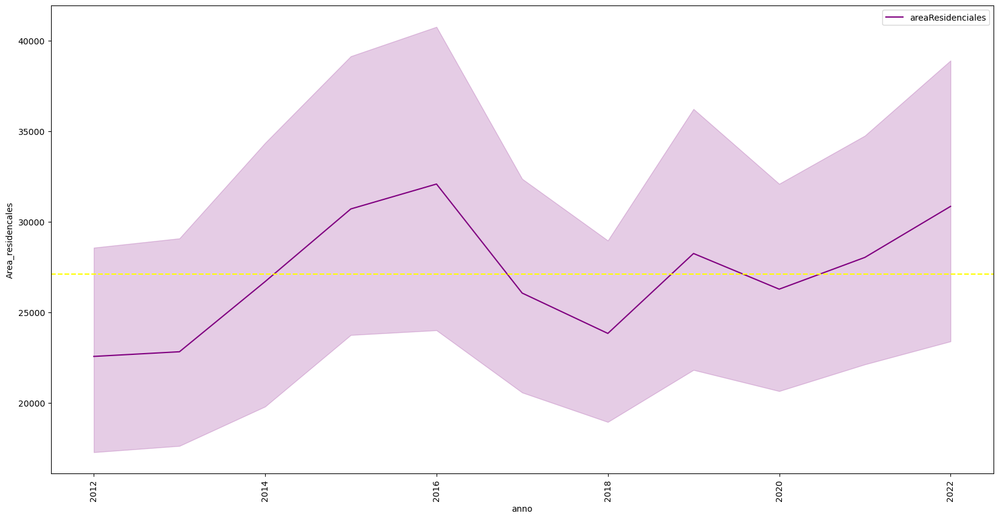

In [159]:
plt.figure(figsize = (20,10))
sns.lineplot(data = df, x = "anno", y = "Area_residencales", color = "purple", label = "areaResidenciales")
plt.axhline(y=df["Area_residencales"].mean(),  color="yellow", linestyle = "--", label = "Media")
plt.xticks(rotation=90)
plt.show()

In [66]:
s_t_area_residenciales = pd.DataFrame()
s_t_area_residenciales["Area_residencales"] = df["Area_residencales"]

In [67]:
cf_cycles, cf_trend = sm.tsa.filters.cffilter(s_t_area_residenciales['Area_residencales'])

In [68]:
s_t_area_residenciales["cf_trend"] = cf_trend
s_t_area_residenciales['cf_cycle'] = cf_cycles
s_t_area_residenciales['non_cf_cycle'] = s_t_area_residenciales['Area_residencales'] - s_t_area_residenciales['cf_cycle']

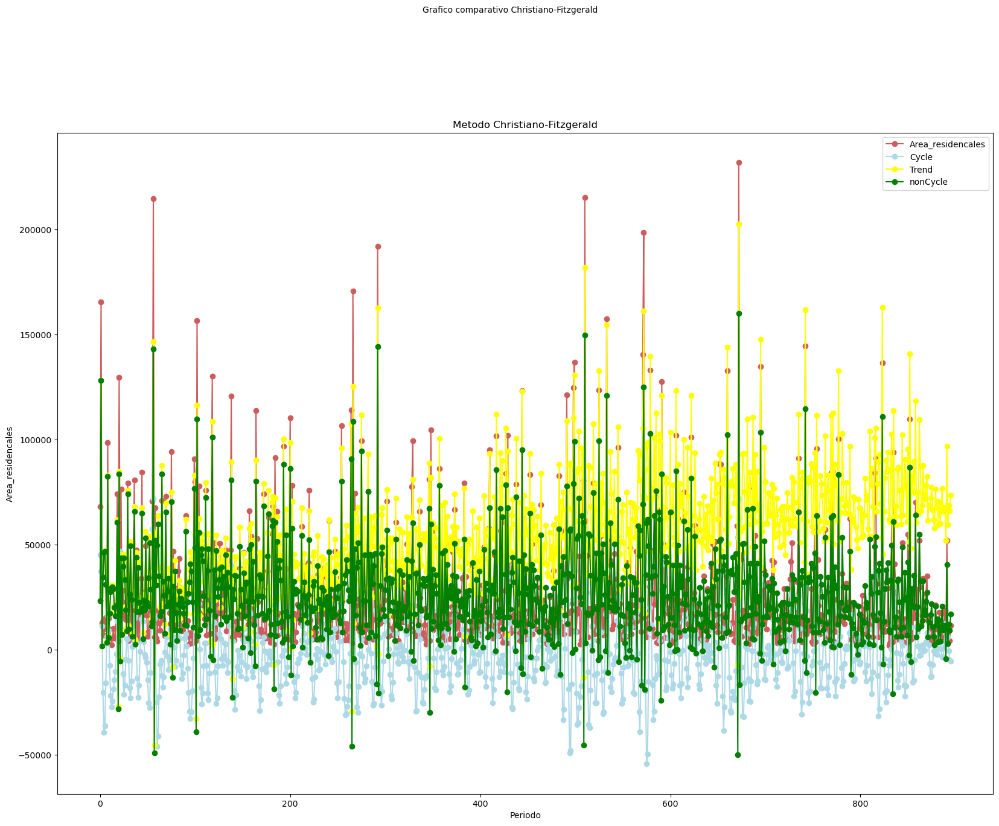

In [69]:

fig, (ax1) = plt.subplots(1,1, figsize = (20,15))
fig.suptitle('Grafico comparativo Christiano-Fitzgerald', fontsize =10)

# simple
ax1.plot(s_t_area_residenciales.index, s_t_area_residenciales['Area_residencales'],
         '-o',  color = 'indianred', label = 'Area_residencales')
ax1.plot(s_t_area_residenciales.index, s_t_area_residenciales['cf_cycle'],
         '-o',  color = 'lightblue', label = 'Cycle')
ax1.plot(s_t_area_residenciales.index, s_t_area_residenciales['cf_trend'],
         '-o',  color = 'yellow', label = 'Trend')
ax1.plot(s_t_area_residenciales.index, s_t_area_residenciales["non_cf_cycle"],
         '-o',  color = 'green', label = 'nonCycle')
ax1.set(xlabel= 'Periodo', ylabel= "Area_residencales")
ax1.set_title('Metodo Christiano-Fitzgerald')
ax1.legend(loc='best')

plt.subplots_adjust(top=0.84)

plt.show()
     

- valor_residenciales

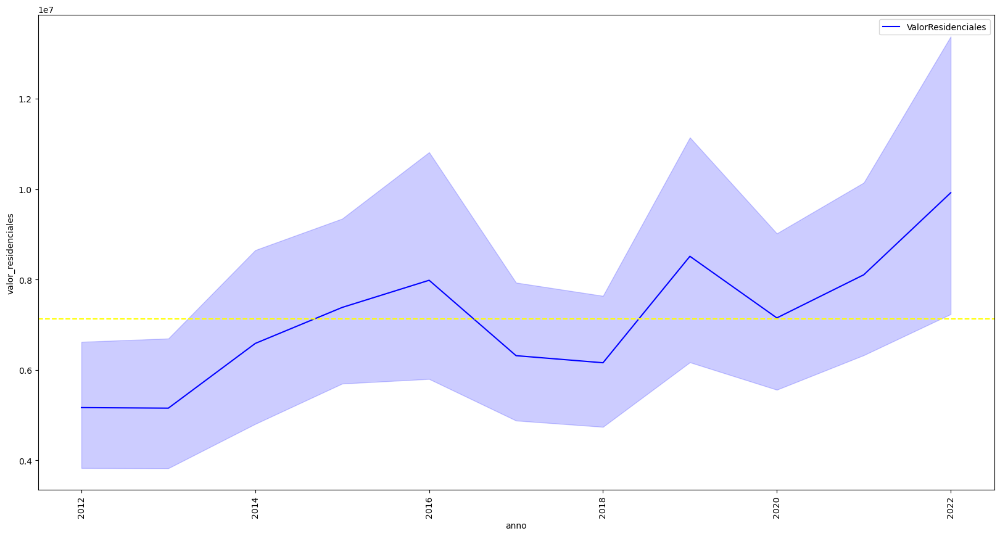

In [160]:
plt.figure(figsize = (20,10))
sns.lineplot(data = df, x = "anno", y = "valor_residenciales", color = "blue", label = "ValorResidenciales")
plt.axhline(y=df["valor_residenciales"].mean(),  color="yellow", linestyle = "--", label = "Media")
plt.xticks(rotation=90)
plt.show()

In [70]:
s_t_valor_residenciales = pd.DataFrame()
s_t_valor_residenciales["valor_residenciales"] = df["valor_residenciales"]

In [71]:
cf_cycles, cf_trend = sm.tsa.filters.cffilter(s_t_valor_residenciales['valor_residenciales'])

In [72]:
s_t_valor_residenciales["cf_trend"] = cf_trend
s_t_valor_residenciales['cf_cycle'] = cf_cycles
s_t_valor_residenciales['non_cf_cycle'] = s_t_valor_residenciales['valor_residenciales'] - s_t_valor_residenciales['cf_cycle']

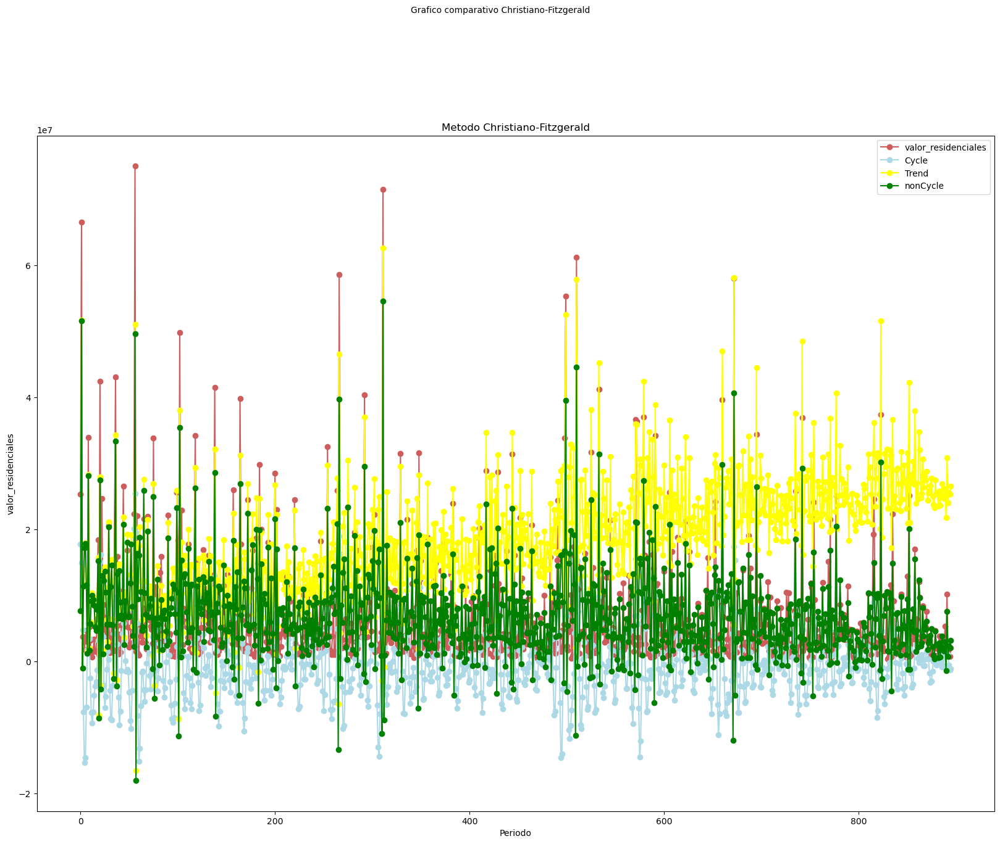

In [73]:

fig, (ax1) = plt.subplots(1,1, figsize = (20,15))
fig.suptitle('Grafico comparativo Christiano-Fitzgerald', fontsize =10)

# simple
ax1.plot(s_t_valor_residenciales.index, s_t_valor_residenciales['valor_residenciales'],
         '-o',  color = 'indianred', label = 'valor_residenciales')
ax1.plot(s_t_valor_residenciales.index, s_t_valor_residenciales['cf_cycle'],
         '-o',  color = 'lightblue', label = 'Cycle')
ax1.plot(s_t_valor_residenciales.index, s_t_valor_residenciales['cf_trend'],
         '-o',  color = 'yellow', label = 'Trend')
ax1.plot(s_t_valor_residenciales.index, s_t_valor_residenciales["non_cf_cycle"],
         '-o',  color = 'green', label = 'nonCycle')
ax1.set(xlabel= 'Periodo', ylabel= "valor_residenciales")
ax1.set_title('Metodo Christiano-Fitzgerald')
ax1.legend(loc='best')

plt.subplots_adjust(top=0.84)

plt.show()
     

- numero_de_obras_en_construccion_noresidenciales

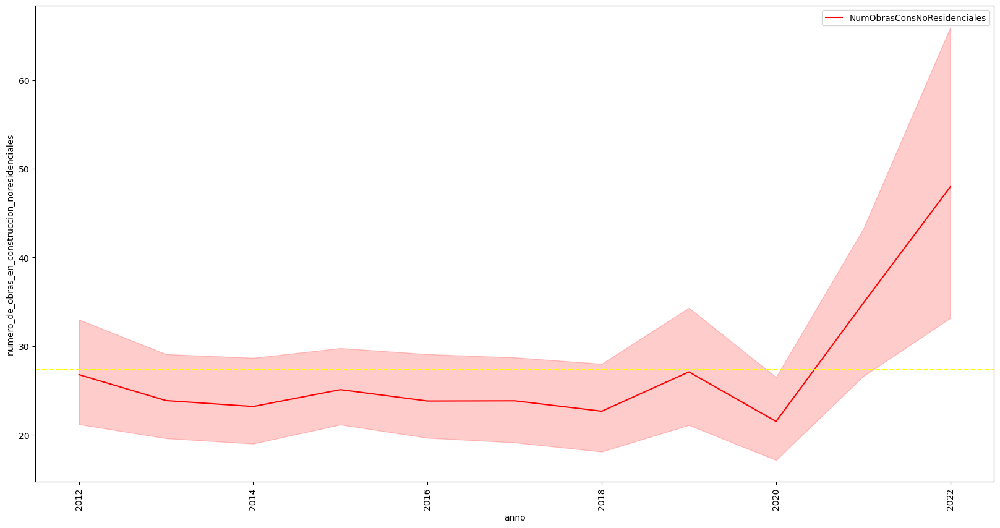

In [161]:
plt.figure(figsize = (20,10))
sns.lineplot(data = df, x = "anno", y = "numero_de_obras_en_construccion_noresidenciales", color = "red", 
             label = "NumObrasConsNoResidenciales")
plt.axhline(y=df["numero_de_obras_en_construccion_noresidenciales"].mean(),  color="yellow", linestyle = "--", label = "Media")
plt.xticks(rotation=90)
plt.show()

In [115]:
s_t_num_obras_No_residenciales = pd.DataFrame()
s_t_num_obras_No_residenciales["numero_de_obras_en_construccion_noresidenciales"] = df["numero_de_obras_en_construccion_noresidenciales"]

In [116]:
cf_cycles, cf_trend = sm.tsa.filters.cffilter(s_t_num_obras_No_residenciales['numero_de_obras_en_construccion_noresidenciales'])

In [117]:
s_t_num_obras_No_residenciales["cf_trend"] = cf_trend
s_t_num_obras_No_residenciales['cf_cycle'] = cf_cycles
s_t_num_obras_No_residenciales['non_cf_cycle'] = s_t_num_obras_No_residenciales['numero_de_obras_en_construccion_noresidenciales'] - s_t_num_obras_No_residenciales['cf_cycle']

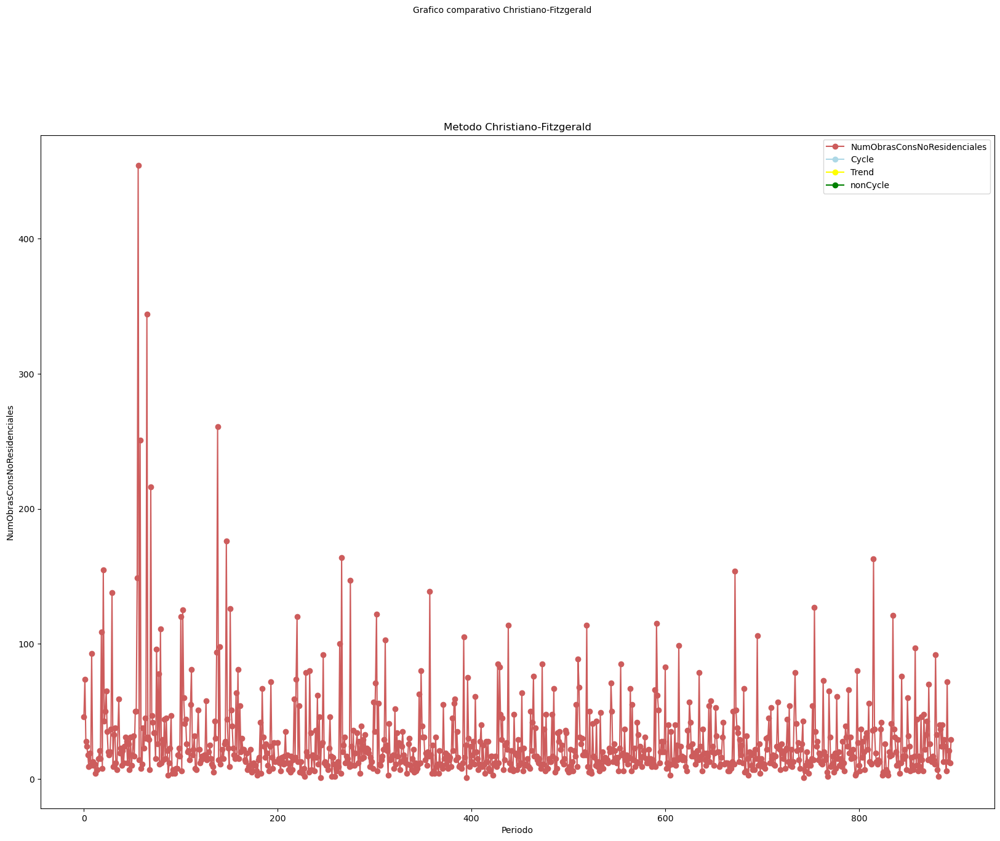

In [120]:

fig, (ax1) = plt.subplots(1,1, figsize = (20,15))
fig.suptitle('Grafico comparativo Christiano-Fitzgerald', fontsize =10)

# simple
ax1.plot(s_t_num_obras_No_residenciales.index, s_t_num_obras_No_residenciales['numero_de_obras_en_construccion_noresidenciales'],
         '-o',  color = 'indianred', label = 'NumObrasConsNoResidenciales')
ax1.plot(s_t_num_obras_No_residenciales.index, s_t_num_obras_No_residenciales['cf_cycle'],
         '-o',  color = 'lightblue', label = 'Cycle')
ax1.plot(s_t_num_obras_No_residenciales.index, s_t_num_obras_No_residenciales['cf_trend'],
         '-o',  color = 'yellow', label = 'Trend')
ax1.plot(s_t_num_obras_No_residenciales.index, s_t_num_obras_No_residenciales["non_cf_cycle"],
         '-o',  color = 'green', label = 'nonCycle')
ax1.set(xlabel= 'Periodo', ylabel= "NumObrasConsNoResidenciales")
ax1.set_title('Metodo Christiano-Fitzgerald')
ax1.legend(loc='best')

plt.subplots_adjust(top=0.84)

plt.show()

Desconozco por que no me da los resultados pero probablemente no es posible realizar la desestacionalización

- area_de_obras_en_construccion_noresidenciales

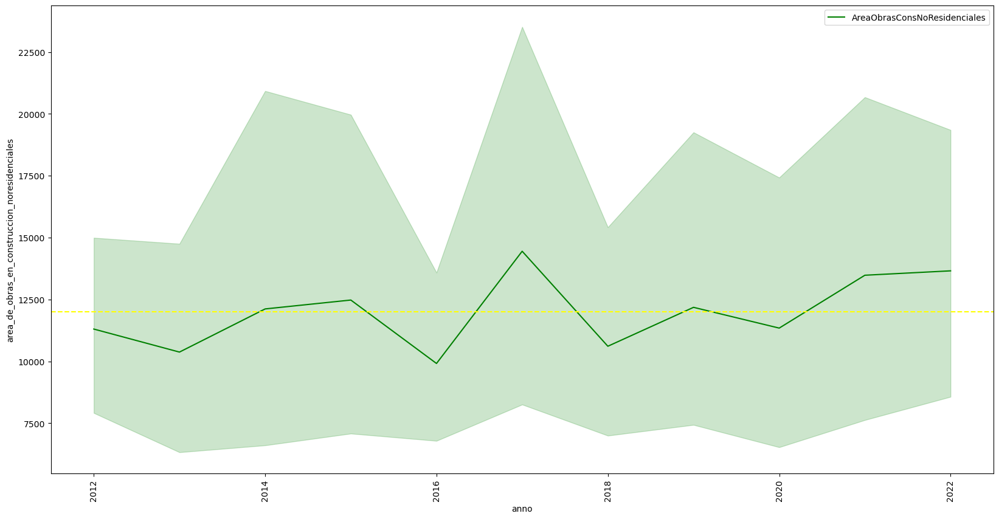

In [162]:
plt.figure(figsize = (20,10))
sns.lineplot(data = df, x = "anno", y = "area_de_obras_en_construccion_noresidenciales", color = "green",
            label = "AreaObrasConsNoResidenciales")
plt.axhline(y=df["area_de_obras_en_construccion_noresidenciales"].mean(),  color="yellow", linestyle = "--", label = "Media")
plt.xticks(rotation=90)
plt.show()

In [121]:
s_t_area_No_residenciales = pd.DataFrame()
s_t_area_No_residenciales["area_de_obras_en_construccion_noresidenciales"] = df["area_de_obras_en_construccion_noresidenciales"]

In [122]:
cf_cycles, cf_trend = sm.tsa.filters.cffilter(s_t_area_No_residenciales['area_de_obras_en_construccion_noresidenciales'])

In [123]:
s_t_area_No_residenciales["cf_trend"] = cf_trend
s_t_area_No_residenciales['cf_cycle'] = cf_cycles
s_t_area_No_residenciales['non_cf_cycle'] = s_t_area_No_residenciales['area_de_obras_en_construccion_noresidenciales'] - s_t_area_No_residenciales['cf_cycle']

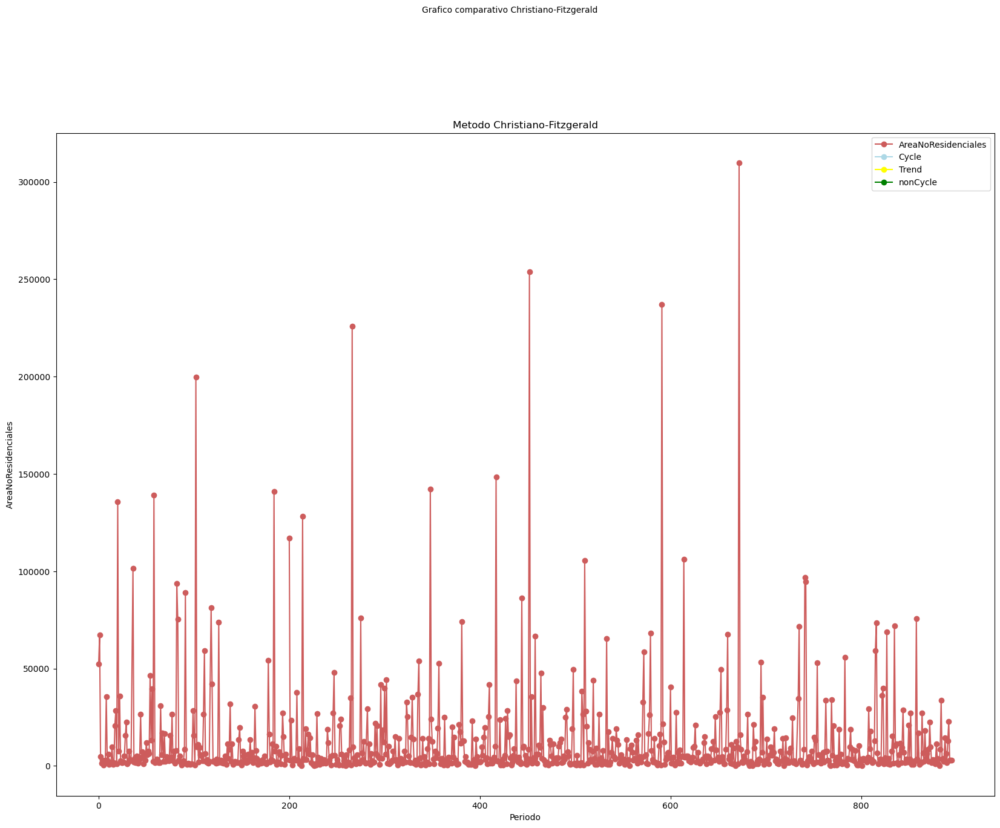

In [124]:

fig, (ax1) = plt.subplots(1,1, figsize = (20,15))
fig.suptitle('Grafico comparativo Christiano-Fitzgerald', fontsize =10)

# simple
ax1.plot(s_t_area_No_residenciales.index, s_t_area_No_residenciales['area_de_obras_en_construccion_noresidenciales'],
         '-o',  color = 'indianred', label = 'AreaNoResidenciales')
ax1.plot(s_t_area_No_residenciales.index, s_t_area_No_residenciales['cf_cycle'],
         '-o',  color = 'lightblue', label = 'Cycle')
ax1.plot(s_t_area_No_residenciales.index, s_t_area_No_residenciales['cf_trend'],
         '-o',  color = 'yellow', label = 'Trend')
ax1.plot(s_t_area_No_residenciales.index, s_t_area_No_residenciales["non_cf_cycle"],
         '-o',  color = 'green', label = 'nonCycle')
ax1.set(xlabel= 'Periodo', ylabel= "AreaNoResidenciales")
ax1.set_title('Metodo Christiano-Fitzgerald')
ax1.legend(loc='best')

plt.subplots_adjust(top=0.84)

plt.show()

- valor_no_residenciales

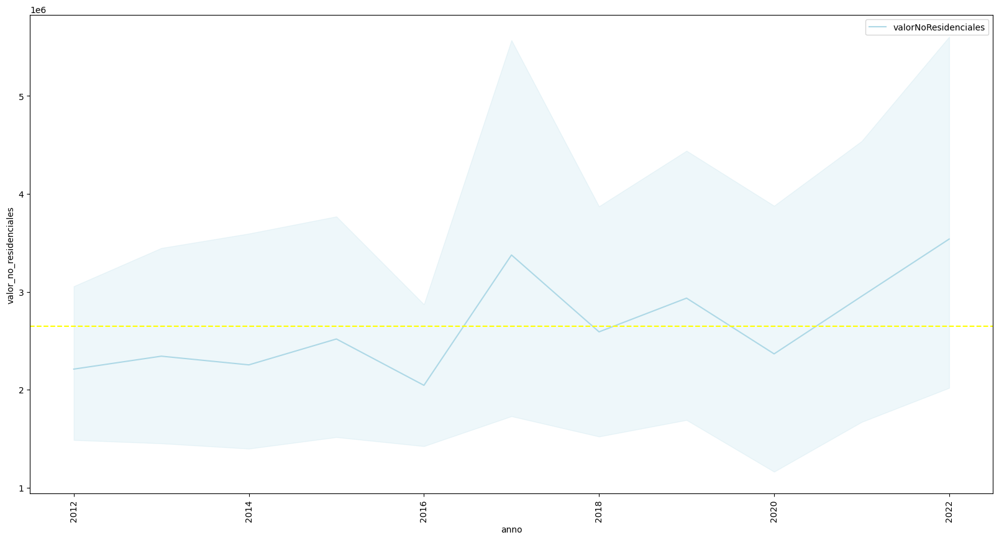

In [164]:
plt.figure(figsize = (20,10))
sns.lineplot(data = df, x = "anno", y = "valor_no_residenciales", color = "lightblue",
            label = "valorNoResidenciales")
plt.axhline(y=df["valor_no_residenciales"].mean(),  color="yellow", linestyle = "--", label = "Media")
plt.xticks(rotation=90)
plt.show()

In [125]:
s_t_valor_no_residencial = pd.DataFrame()
s_t_valor_no_residencial["valor_no_residenciales"] = df["valor_no_residenciales"]

In [126]:
cf_cycles, cf_trend = sm.tsa.filters.cffilter(s_t_valor_no_residencial['valor_no_residenciales'])

In [127]:
s_t_valor_no_residencial["cf_trend"] = cf_trend
s_t_valor_no_residencial['cf_cycle'] = cf_cycles
s_t_valor_no_residencial['non_cf_cycle'] = s_t_valor_no_residencial['valor_no_residenciales'] - s_t_valor_no_residencial['cf_cycle']

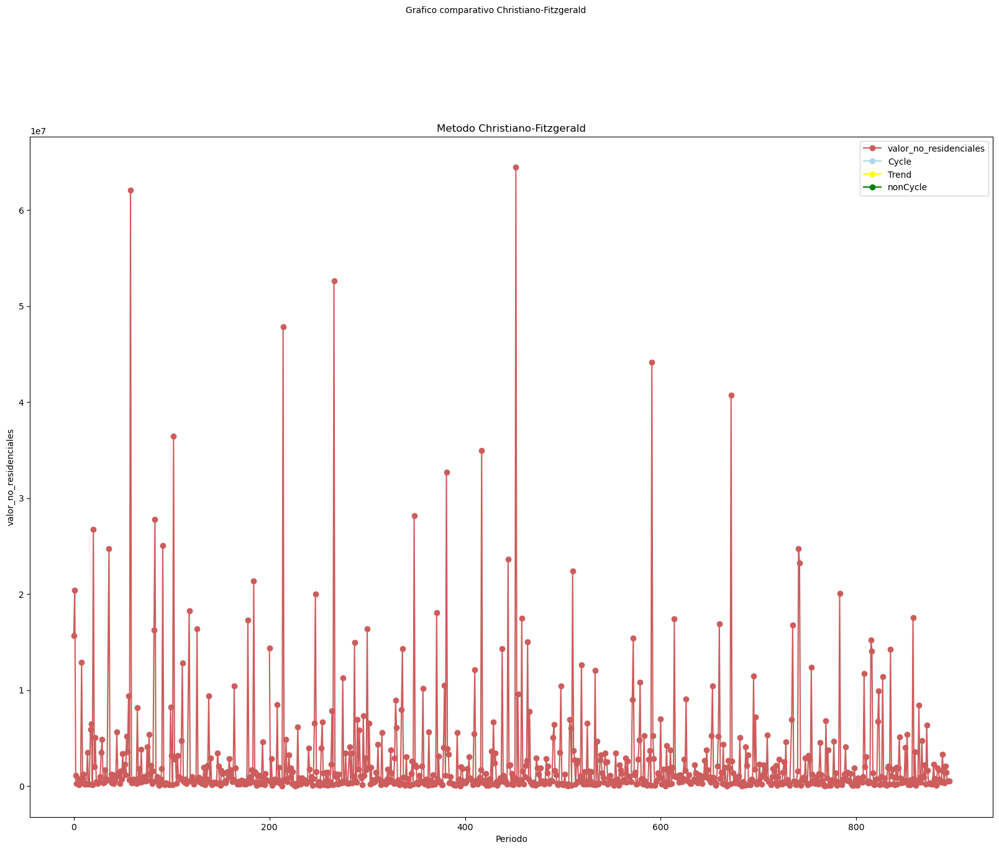

In [128]:

fig, (ax1) = plt.subplots(1,1, figsize = (20,15))
fig.suptitle('Grafico comparativo Christiano-Fitzgerald', fontsize =10)

# simple
ax1.plot(s_t_valor_no_residencial.index, s_t_valor_no_residencial['valor_no_residenciales'],
         '-o',  color = 'indianred', label = 'valor_no_residenciales')
ax1.plot(s_t_valor_no_residencial.index, s_t_valor_no_residencial['cf_cycle'],
         '-o',  color = 'lightblue', label = 'Cycle')
ax1.plot(s_t_valor_no_residencial.index, s_t_valor_no_residencial['cf_trend'],
         '-o',  color = 'yellow', label = 'Trend')
ax1.plot(s_t_valor_no_residencial.index, s_t_valor_no_residencial["non_cf_cycle"],
         '-o',  color = 'green', label = 'nonCycle')
ax1.set(xlabel= 'Periodo', ylabel= "valor_no_residenciales")
ax1.set_title('Metodo Christiano-Fitzgerald')
ax1.legend(loc='best')

plt.subplots_adjust(top=0.84)

plt.show()

## Bivariate Analysis

- Matriz de Correlación 

In [127]:
lista_de_columnas = df.select_dtypes(include=np.number).columns.tolist()
lista_de_columnas.remove('anno')
lista_de_columnas

['numero_de_obras_en_construccion_total',
 'area_total',
 'valor_total',
 'numero_de_obras_en_construccion_residenciales',
 'Area_residencales',
 'valor_residenciales',
 'numero_de_obras_en_construccion_noresidenciales',
 'area_de_obras_en_construccion_noresidenciales',
 'valor_no_residenciales']

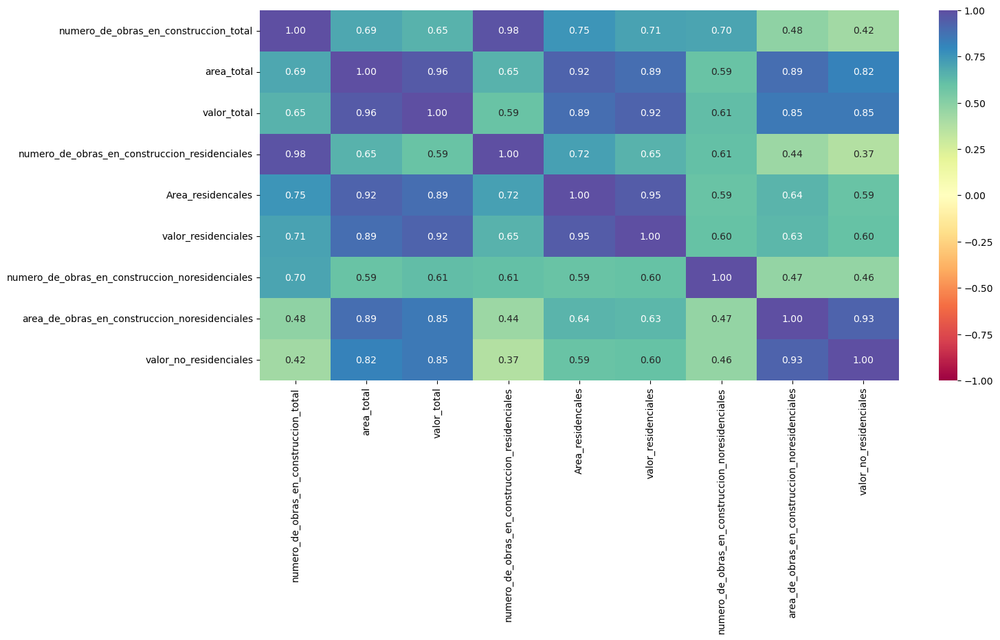

In [129]:
plt.figure(figsize=(15, 7))
sns.heatmap(
    df[lista_de_columnas].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
)
plt.show()

- Matriz traspuesta media


Aquí luis hace la matriz espacial

### Gráficos de dispersión

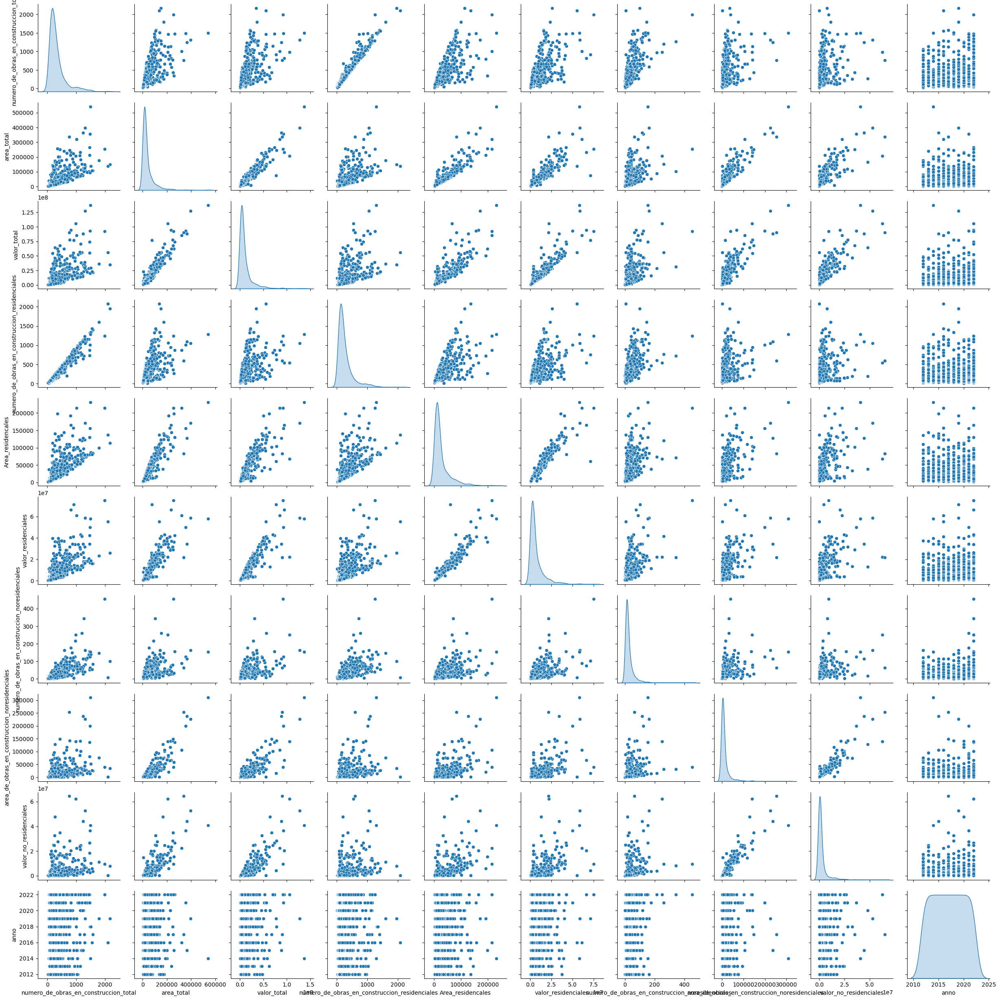

In [130]:
sns.pairplot(df,diag_kind="kde")

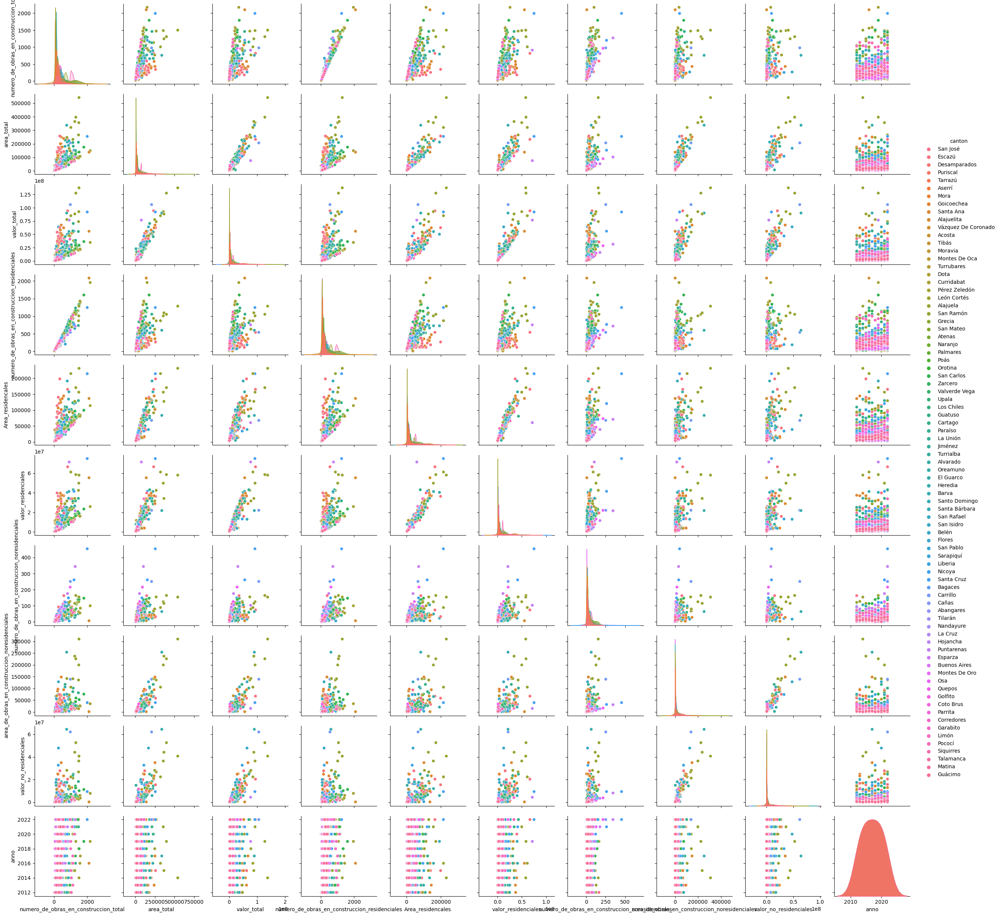

In [131]:
sns.pairplot(df, hue = "canton")

- Número de obras según canton

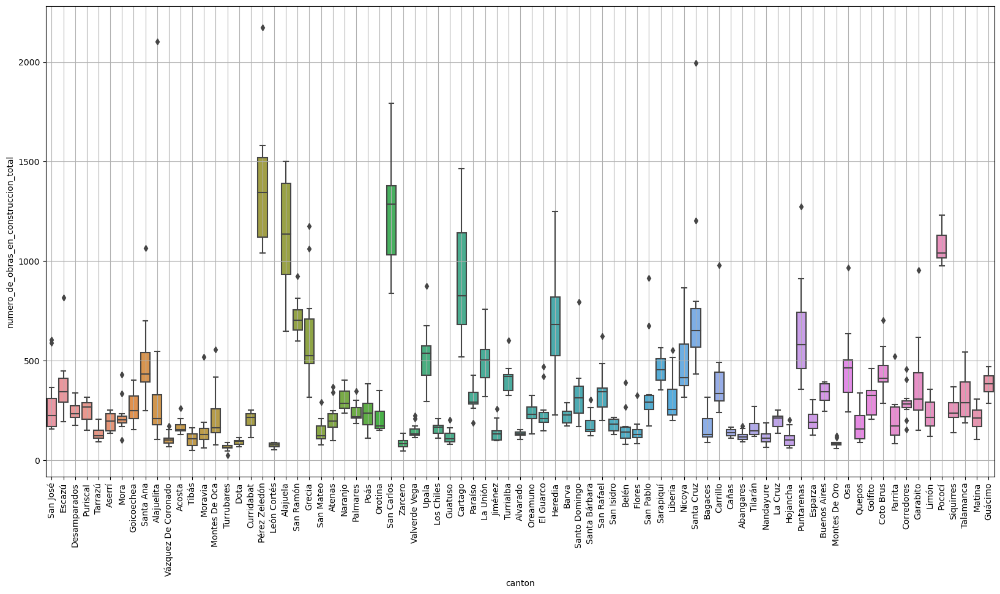

In [134]:
plt.figure(figsize = (20,10))
sns.boxplot(data=df, x='canton', y='numero_de_obras_en_construccion_total') ; 
plt.xticks(rotation=90)
plt.grid(True)

- Número de obras con area total respecto a los cantones 

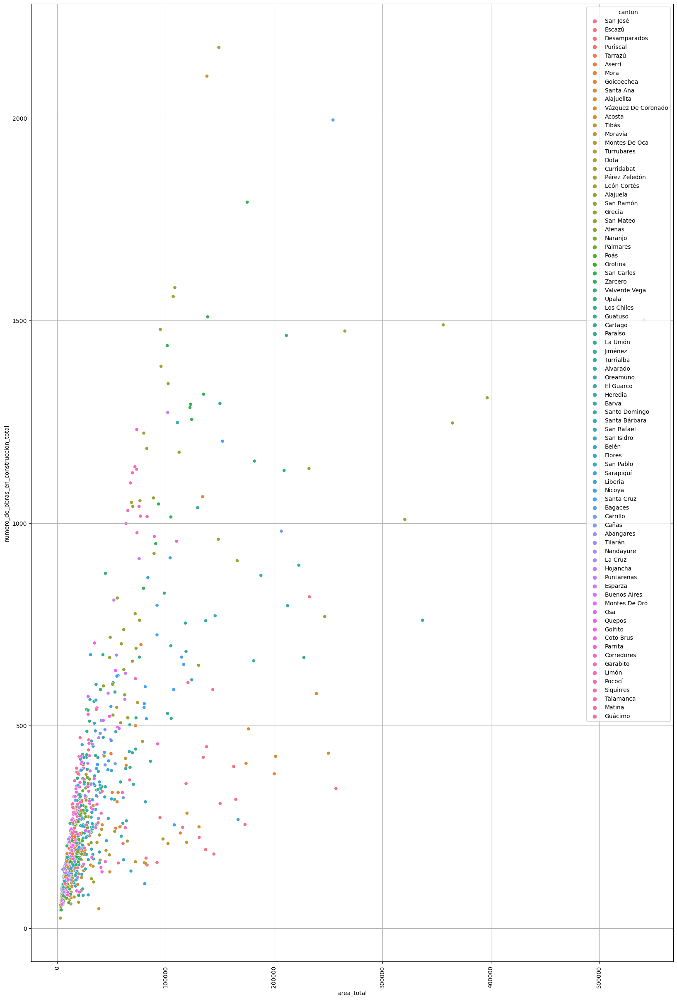

In [138]:
plt.figure(figsize = (20,30))
sns.scatterplot(data=df, x='area_total', y='numero_de_obras_en_construccion_total', hue='canton'); 
plt.xticks(rotation=90)
plt.grid(True)

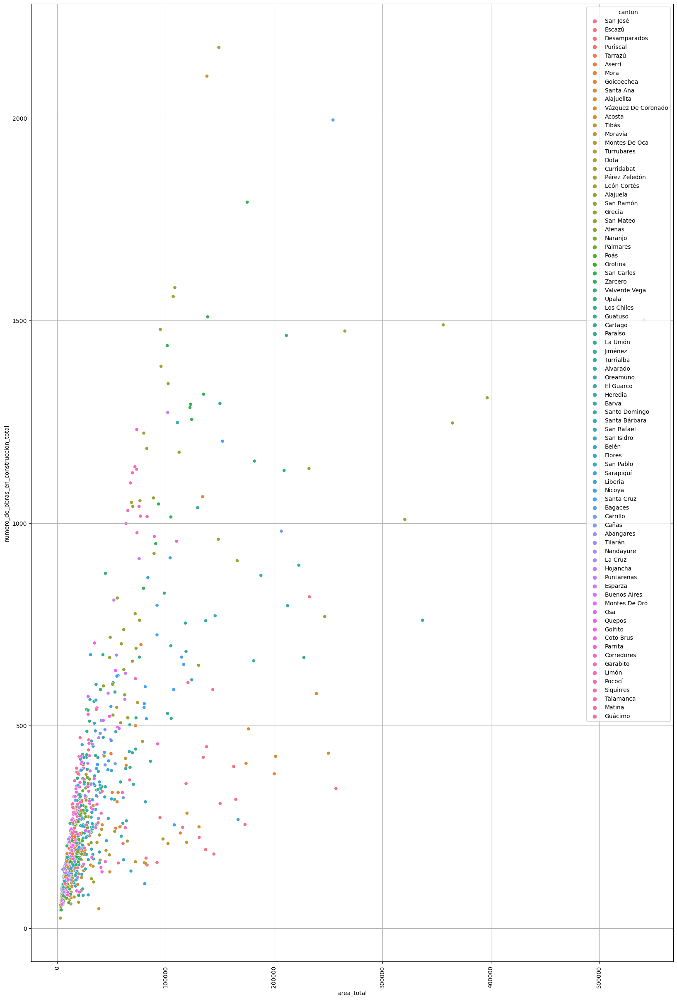

In [139]:
plt.figure(figsize = (20,30))
sns.scatterplot(data=df, x='area_total', y='numero_de_obras_en_construccion_total', hue='canton'); 
plt.xticks(rotation=90)
plt.grid(True)

In [140]:
df.columns

Index(['canton', 'numero_de_obras_en_construccion_total', 'area_total',
       'valor_total', 'numero_de_obras_en_construccion_residenciales',
       'Area_residencales', 'valor_residenciales',
       'numero_de_obras_en_construccion_noresidenciales',
       'area_de_obras_en_construccion_noresidenciales',
       'valor_no_residenciales', 'anno'],
      dtype='object')

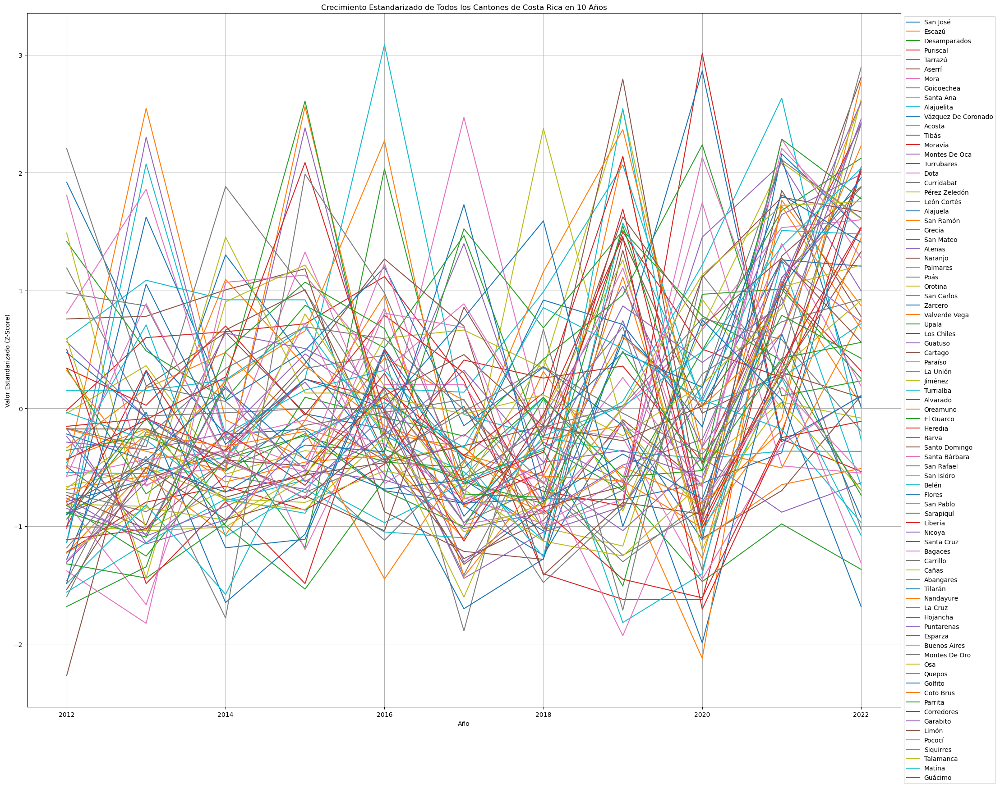

In [144]:
cantones = df['canton'].unique()

plt.figure(figsize=(25, 20))
scaler = StandardScaler()

for canton in cantones:
    datos_canton = df[df['canton'] == canton]
    valores = datos_canton['numero_de_obras_en_construccion_total'].values.reshape(-1, 1)
    valores_estandarizados = scaler.fit_transform(valores)
    plt.plot(datos_canton['anno'], valores_estandarizados, label=canton)

plt.xlabel('Año')
plt.ylabel('Valor Estandarizado (Z-Score)')
plt.title('Crecimiento Estandarizado de Todos los Cantones de Costa Rica en 10 Años')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()

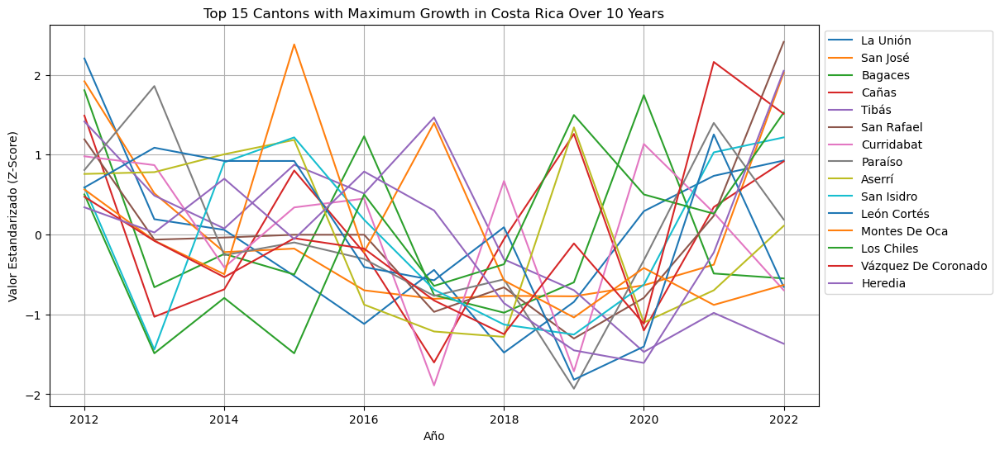

In [129]:
# Determine the number of top cantons you want to display
top_n_cantons = 15  # Change this number to your desired value

# Create a list to store the top N cantons based on maximum growth
top_cantons = []

# Calculate z-scores for all cantons and find the top N
scaler = StandardScaler()
for canton in df['canton'].unique():
    datos_canton = df[df['canton'] == canton]
    valores = datos_canton['numero_de_obras_en_construccion_total'].values.reshape(-1, 1)
    valores_estandarizados = scaler.fit_transform(valores)
    max_growth = valores_estandarizados[-1]  # Assuming you want to measure growth at the last year
    top_cantons.append((canton, max_growth))

# Sort the top cantons by maximum growth
top_cantons.sort(key=lambda x: x[1], reverse=True)
top_cantons = top_cantons[:top_n_cantons]  # Select the top N cantons

# Create a line chart for the top N cantons
plt.figure(figsize=(12, 6))
for canton, _ in top_cantons:
    datos_canton = df[df['canton'] == canton]
    valores = datos_canton['numero_de_obras_en_construccion_total'].values.reshape(-1, 1)
    valores_estandarizados = scaler.fit_transform(valores)
    plt.plot(datos_canton['anno'], valores_estandarizados, label=canton)

plt.xlabel('Año')
plt.ylabel('Valor Estandarizado (Z-Score)')
plt.title(f'Top {top_n_cantons} Cantons with Maximum Growth in Costa Rica Over 10 Years')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()

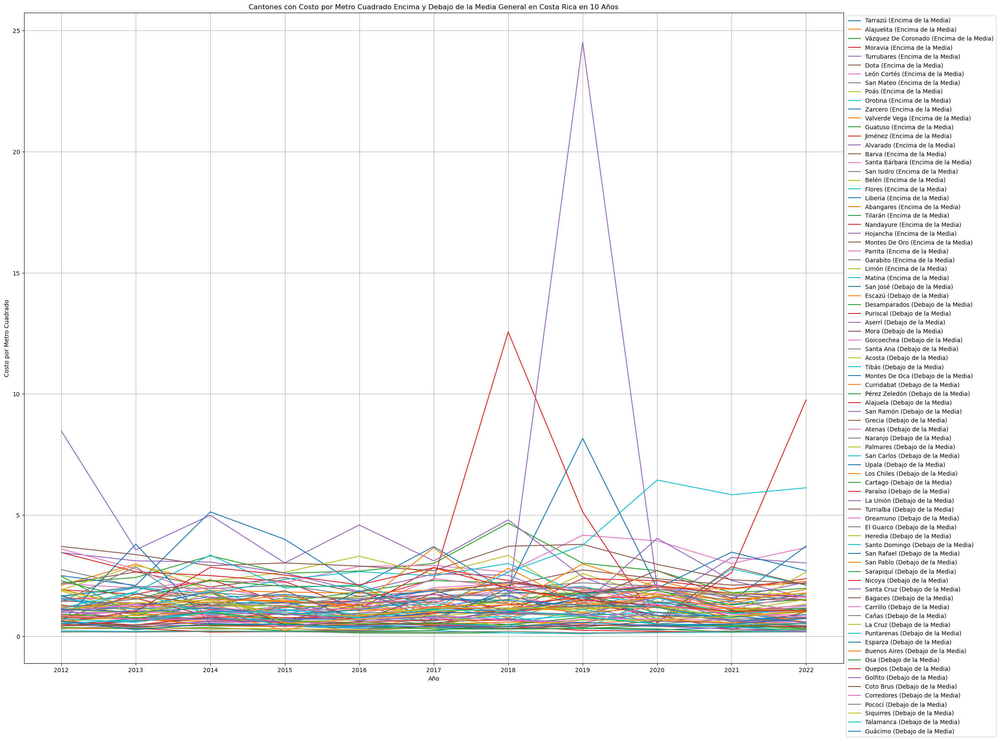

In [147]:
# Calcular la relación costo por metro cuadrado para todos los cantones
cantones_relacion_metro_cuadrado = []
for canton in df['canton'].unique():
    datos_canton = df[df['canton'] == canton]
    costo = datos_canton['valor_total'].values
    construcciones = datos_canton['numero_de_obras_en_construccion_total'].values
    area = datos_canton['area_total'].values

    # Calcular la relación costo por metro cuadrado
    relacion_metro_cuadrado = costo[-1] / (construcciones[-1] * area[-1])  # Puedes ajustar los años según sea necesario
    cantones_relacion_metro_cuadrado.append((canton, relacion_metro_cuadrado))

# Calcular la media general de la relación costo por metro cuadrado
media_general = sum([relacion for _, relacion in cantones_relacion_metro_cuadrado]) / len(cantones_relacion_metro_cuadrado)

# Crear listas para almacenar los cantones por encima y por debajo de la media general
cantones_encima_media = []
cantones_debajo_media = []

# Identificar los cantones por encima y por debajo de la media general
for canton, relacion_metro_cuadrado in cantones_relacion_metro_cuadrado:
    if relacion_metro_cuadrado >= media_general:
        cantones_encima_media.append((canton, relacion_metro_cuadrado))
    else:
        cantones_debajo_media.append((canton, relacion_metro_cuadrado))

# Crear un gráfico de líneas para los cantones por encima y por debajo de la media general
plt.figure(figsize=(25, 20))

for canton, _ in cantones_encima_media:
    datos_canton = df[df['canton'] == canton]
    plt.plot(datos_canton['anno'], datos_canton['valor_total'] / (datos_canton['numero_de_obras_en_construccion_total'] * datos_canton['area_total']), label=f'{canton} (Encima de la Media)')

for canton, _ in cantones_debajo_media:
    datos_canton = df[df['canton'] == canton]
    plt.plot(datos_canton['anno'], datos_canton['valor_total'] / (datos_canton['numero_de_obras_en_construccion_total'] * datos_canton['area_total']), label=f'{canton} (Debajo de la Media)')

plt.xlabel('Año')
plt.ylabel('Costo por Metro Cuadrado')
plt.title(f'Cantones con Costo por Metro Cuadrado Encima y Debajo de la Media General en Costa Rica en 10 Años')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)

# Configurar los saltos de x de 1 en 1
plt.xticks(range(min(df['anno']), max(df['anno'])+1))

plt.show()



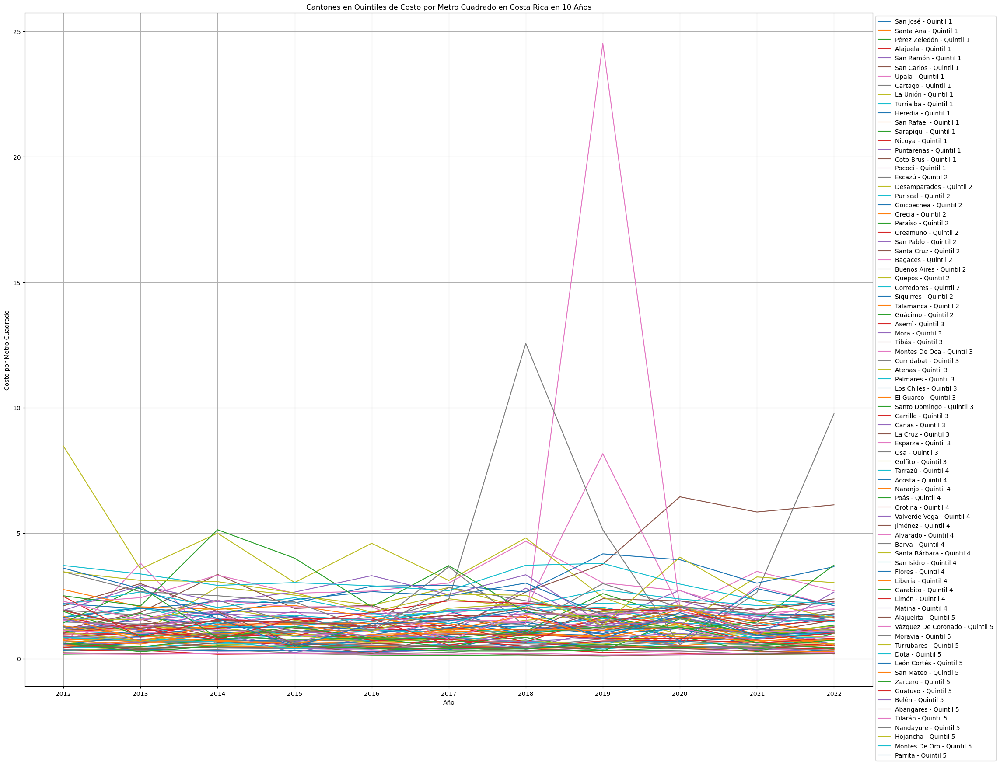

In [131]:
import matplotlib.pyplot as plt
import numpy as np

# Calcular la relación costo por metro cuadrado para todos los cantones
cantones_relacion_metro_cuadrado = []

for canton in df['canton'].unique():
    datos_canton = df[df['canton'] == canton]
    costo = datos_canton['valor_total'].values
    construcciones = datos_canton['numero_de_obras_en_construccion_total'].values
    area = datos_canton['area_total'].values

    # Calcular la relación costo por metro cuadrado
    relacion_metro_cuadrado = costo[-1] / (construcciones[-1] * area[-1])  # Puedes ajustar los años según sea necesario
    cantones_relacion_metro_cuadrado.append((canton, relacion_metro_cuadrado))

# Obtener las relaciones de costo por metro cuadrado
relaciones_metro_cuadrado = [relacion for _, relacion in cantones_relacion_metro_cuadrado]

# Calcular los quintiles
quintiles = np.percentile(relaciones_metro_cuadrado, [20, 40, 60, 80])

# Crear listas para almacenar los cantones en cada quintil
cantones_quintil = [[] for _ in range(5)]

# Clasificar los cantones en los quintiles
for canton, relacion_metro_cuadrado in cantones_relacion_metro_cuadrado:
    if relacion_metro_cuadrado <= quintiles[0]:
        cantones_quintil[0].append((canton, relacion_metro_cuadrado))
    elif relacion_metro_cuadrado <= quintiles[1]:
        cantones_quintil[1].append((canton, relacion_metro_cuadrado))
    elif relacion_metro_cuadrado <= quintiles[2]:
        cantones_quintil[2].append((canton, relacion_metro_cuadrado))
    elif relacion_metro_cuadrado <= quintiles[3]:
        cantones_quintil[3].append((canton, relacion_metro_cuadrado))
    else:
        cantones_quintil[4].append((canton, relacion_metro_cuadrado))

# Crear un gráfico de líneas para los cantones en cada quintil
plt.figure(figsize=(25, 20))

for i, quintil in enumerate(cantones_quintil):
    for canton, relacion_metro_cuadrado in quintil:
        datos_canton = df[df['canton'] == canton]
        plt.plot(datos_canton['anno'], datos_canton['valor_total'] / (datos_canton['numero_de_obras_en_construccion_total'] * datos_canton['area_total']), label=f'{canton} - Quintil {i + 1}')

plt.xlabel('Año')
plt.ylabel('Costo por Metro Cuadrado')
plt.title('Cantones en Quintiles de Costo por Metro Cuadrado en Costa Rica en 10 Años')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)

# Configurar los saltos de x de 1 en 1
plt.xticks(range(min(df['anno']), max(df['anno'])+1))

plt.show()


In [132]:
import pandas as pd
import numpy as np

# Calcular la relación costo por metro cuadrado para todos los cantones
cantones_relacion_metro_cuadrado = []

for canton in df['canton'].unique():
    datos_canton = df[df['canton'] == canton]
    costo = datos_canton['valor_total'].values
    construcciones = datos_canton['numero_de_obras_en_construccion_total'].values
    area = datos_canton['area_total'].values

    # Calcular la relación costo por metro cuadrado
    relacion_metro_cuadrado = costo[-1] / (construcciones[-1] * area[-1])  # Puedes ajustar los años según sea necesario
    cantones_relacion_metro_cuadrado.append((canton, relacion_metro_cuadrado))

# Obtener las relaciones de costo por metro cuadrado
relaciones_metro_cuadrado = [relacion for _, relacion in cantones_relacion_metro_cuadrado]

# Calcular los quintiles
quintiles = np.percentile(relaciones_metro_cuadrado, [20, 40, 60, 80])

# Crear listas para almacenar los cantones en cada quintil
cantones_quintil = [[] for _ in range(5)]

# Clasificar los cantones en los quintiles
for canton, relacion_metro_cuadrado in cantones_relacion_metro_cuadrado:
    if relacion_metro_cuadrado <= quintiles[0]:
        cantones_quintil[0].append((canton, relacion_metro_cuadrado))
    elif relacion_metro_cuadrado <= quintiles[1]:
        cantones_quintil[1].append((canton, relacion_metro_cuadrado))
    elif relacion_metro_cuadrado <= quintiles[2]:
        cantones_quintil[2].append((canton, relacion_metro_cuadrado))
    elif relacion_metro_cuadrado <= quintiles[3]:
        cantones_quintil[3].append((canton, relacion_metro_cuadrado))
    else:
        cantones_quintil[4].append((canton, relacion_metro_cuadrado))

# Crear un DataFrame con quintil, cantón y valor puntual de la relación metro cuadrado
data = []

for i, quintil in enumerate(cantones_quintil):
    for canton, relacion_metro_cuadrado in quintil:
        data.append((i + 1, canton, relacion_metro_cuadrado))

df_quintiles = pd.DataFrame(data, columns=['Quintil', 'Cantón', 'Valor de Relación por Metro Cuadrado'])

# Muestra el DataFrame
df_quintiles


,Quintil,Cantón,Valor de Relación por Metro Cuadrado
0,1,San José,0.422952
1,1,Santa Ana,0.560335
2,1,Pérez Zeledón,0.173140
3,1,Alajuela,0.316900
4,1,San Ramón,0.350443
...,...,...,...
76,5,Tilarán,2.283667
77,5,Nandayure,3.455779
78,5,Hojancha,3.453498
79,5,Montes De Oro,3.707264


In [ ]:
result_df = df.groupby('canton').mean()

# Transpose the result so that cantons are in columns
result_df = result_df.T

# Reset the index for a clean layout
result_df = result_df.reset_index()

# Rename the columns for clarity
result_df.columns.name = None

# Rename the 'index' column to something more meaningful
result_df.rename(columns={'index': 'Variable'}, inplace=True)


In [390]:
result_df

,Variable,Abangares,Acosta,Alajuela,Alajuelita,Alvarado,Aserrí,Atenas,Bagaces,Barva,...,Talamanca,Tarrazú,Tibás,Tilarán,Turrialba,Turrubares,Upala,Valverde Vega,Vázquez De Coronado,Zarcero
0,numero_de_obras_en_construccion_total,1.222727e+02,1.685455e+02,1.131727e+03,4.088182e+02,1.320909e+02,1.921818e+02,2.116364e+02,1.688182e+02,2.207273e+02,...,3.205455e+02,1.330909e+02,1.050909e+02,1.663636e+02,4.097273e+02,6.472727e+01,5.232727e+02,1.471818e+02,1.054545e+02,8.481818e+01
1,area_total,8.140091e+03,8.815727e+03,2.881001e+05,4.137436e+04,7.552909e+03,1.229936e+04,2.159100e+04,1.151255e+04,2.445355e+04,...,2.172664e+04,8.218455e+03,3.114291e+04,1.345364e+04,2.584309e+04,5.695273e+03,2.959000e+04,1.083573e+04,1.231091e+04,1.005427e+04
2,valor_total,1.666152e+06,1.915739e+06,7.899530e+07,1.443147e+07,3.515733e+06,3.014909e+06,5.685381e+06,2.440003e+06,6.811205e+06,...,5.108079e+06,1.846872e+06,7.492004e+06,3.490477e+06,5.870762e+06,1.117527e+06,7.241980e+06,2.792512e+06,3.373819e+06,1.854664e+06
3,numero_de_obras_en_construccion_residenciales,1.004545e+02,1.301818e+02,8.928182e+02,3.751818e+02,1.013636e+02,1.510000e+02,1.737273e+02,1.435455e+02,1.646364e+02,...,2.692727e+02,9.536364e+01,6.581818e+01,1.330000e+02,3.489091e+02,5.227273e+01,4.834545e+02,1.132727e+02,6.763636e+01,5.727273e+01
4,Area_residencales,5.537909e+03,7.286000e+03,1.380575e+05,3.040373e+04,6.010455e+03,1.080564e+04,1.839873e+04,8.406000e+03,2.070955e+04,...,1.762655e+04,6.282273e+03,1.754564e+04,1.098155e+04,2.134800e+04,3.466000e+03,2.416791e+04,9.155818e+03,9.439909e+03,4.870727e+03
5,valor_residenciales,1.137926e+06,1.534269e+06,4.008804e+07,1.083555e+07,1.860172e+06,2.593737e+06,4.737440e+06,1.721694e+06,5.591226e+06,...,4.009252e+06,1.383213e+06,4.564326e+06,2.603697e+06,4.517138e+06,7.674386e+05,4.474327e+06,2.340822e+06,2.634286e+06,1.222591e+06
6,numero_de_obras_en_construccion_noresidenciales,1.427273e+01,1.145455e+01,1.163636e+02,8.545455e+00,1.081818e+01,8.181818e+00,1.881818e+01,1.390909e+01,1.272727e+01,...,3.363636e+01,1.400000e+01,1.545455e+01,1.545455e+01,2.527273e+01,9.000000e+00,3.090909e+01,1.236364e+01,7.090909e+00,1.418182e+01
7,area_de_obras_en_construccion_noresidenciales,2.602182e+03,1.529727e+03,1.500425e+05,1.097064e+04,1.542455e+03,1.493727e+03,3.192273e+03,3.106545e+03,3.744000e+03,...,4.100091e+03,1.936182e+03,1.359727e+04,2.472091e+03,4.495091e+03,2.229273e+03,5.422091e+03,1.679909e+03,2.871000e+03,5.183545e+03
8,valor_no_residenciales,4.926093e+05,2.881602e+05,2.780718e+07,2.817904e+06,1.581542e+06,3.201685e+05,7.167445e+05,5.052897e+05,9.117851e+05,...,9.671909e+05,3.448049e+05,2.691007e+06,4.244112e+05,1.121627e+06,2.145660e+05,1.209069e+06,3.140613e+05,5.653090e+05,5.650365e+05
9,anno,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,...,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03,2.017000e+03


In [408]:
gdf = gpd.GeoDataFrame(df2, geometry=gpd.points_from_xy(df2.longitud_wsg84, df2.latitud_wgs84))
gdf = gdf.dropna(subset=['latitud_wgs84', 'longitud_wsg84'])

In [409]:
gdf

,canton,numero_de_obras_en_construccion_total,area_total,valor_total,numero_de_obras_en_construccion_residenciales,Area_residencales,valor_residenciales,numero_de_obras_en_construccion_noresidenciales,area_de_obras_en_construccion_noresidenciales,valor_no_residenciales,anno,latitud_wgs84,longitud_wsg84,geometry
0,San José,606,120630,4.263994e+07,463,68106,2.537038e+07,46.0,52524.0,1.569397e+07,2022,9.934138,-84.073059,POINT (-84.07306 9.93414)
1,Escazú,818,232633,9.425034e+07,543,165440,6.658117e+07,74.0,67193.0,2.039347e+07,2022,9.919695,-84.140285,POINT (-84.14029 9.91969)
2,Desamparados,256,17503,5.230944e+06,144,12604,3.709363e+06,28.0,4899.0,1.131499e+06,2022,9.898578,-84.065009,POINT (-84.06501 9.89858)
3,Puriscal,267,15235,4.208677e+06,194,13994,3.720781e+06,24.0,1241.0,2.440730e+05,2022,9.846364,-84.315837,POINT (-84.31584 9.84636)
4,Tarrazú,168,9666,2.811351e+06,94,6774,1.812307e+06,18.0,2892.0,7.665774e+05,2022,9.659712,-84.022234,POINT (-84.02223 9.65971)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,Pococí,1031,65078,1.247820e+07,931,52072,1.013687e+07,72.0,13006.0,2.107394e+06,2012,10.209112,-83.790010,POINT (-83.79001 10.20911)
887,Siquirres,175,31983,3.230378e+06,157,8997,1.744811e+06,13.0,22986.0,1.431972e+06,2012,10.096901,-83.506948,POINT (-83.50695 10.09690)
888,Talamanca,234,14106,2.347364e+06,205,11277,1.753735e+06,21.0,2829.0,5.425520e+05,2012,9.624982,-82.851955,POINT (-82.85195 9.62498)
889,Matina,110,7286,1.247714e+06,92,4254,7.354300e+05,12.0,3032.0,5.057650e+05,2012,10.076067,-83.291678,POINT (-83.29168 10.07607)


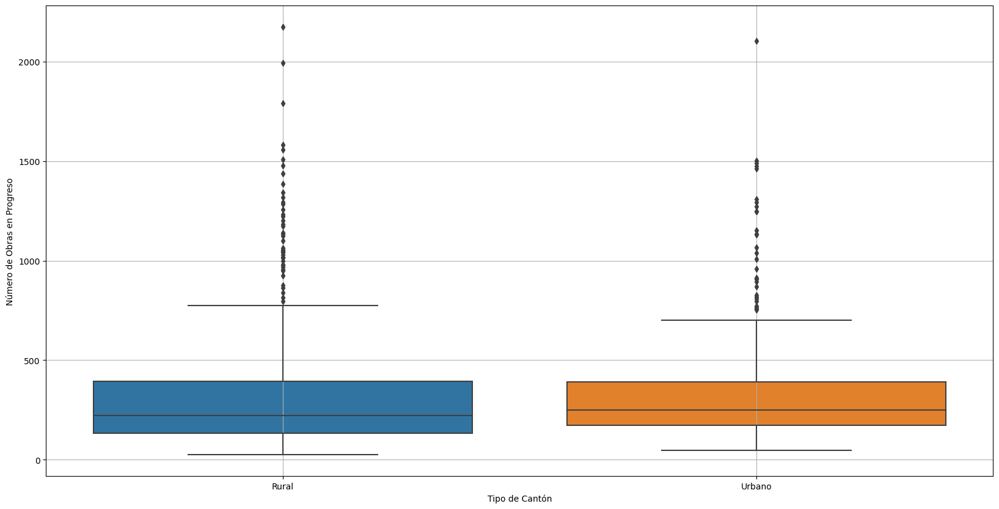

In [178]:
plt.figure(figsize=(20, 10))
sns.boxplot(data=df4, x='urbano', y='numero_de_obras_en_construccion_total')
plt.xticks(ticks=[0, 1], labels=['Rural', 'Urbano'])
plt.grid(True)
plt.xlabel('Tipo de Cantón')
plt.ylabel('Número de Obras en Progreso')
plt.show()

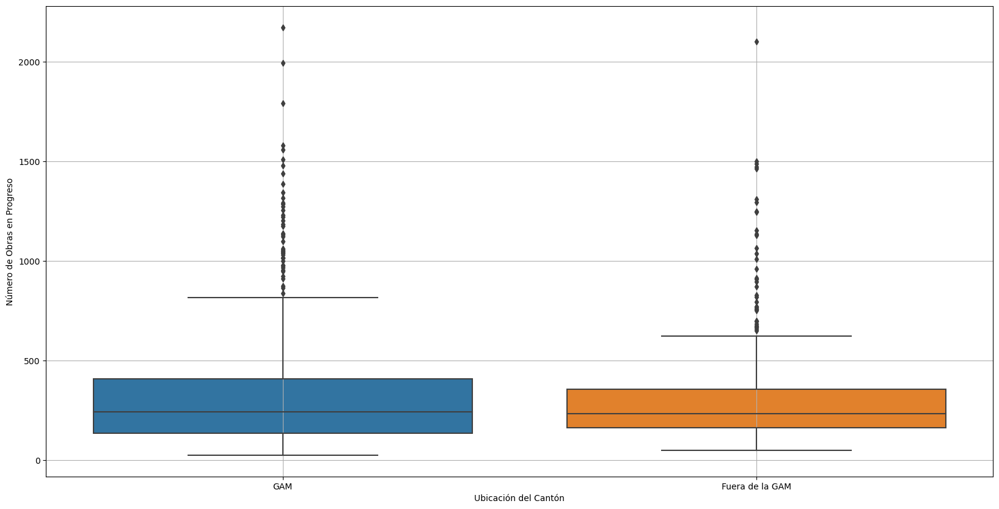

In [179]:
plt.figure(figsize=(20, 10))
sns.boxplot(data=df4, x='gam', y='numero_de_obras_en_construccion_total')
plt.xticks(ticks=[0, 1], labels=['GAM', 'Fuera de la GAM'])
plt.grid(True)
plt.xlabel('Ubicación del Cantón')
plt.ylabel('Número de Obras en Progreso')
plt.show()

In [148]:

gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 862 entries, 0 to 894
Data columns (total 14 columns):
 #   Column                                           Non-Null Count  Dtype   
---  ------                                           --------------  -----   
 0   canton                                           862 non-null    object  
 1   numero_de_obras_en_construccion_total            862 non-null    int64   
 2   area_total                                       862 non-null    int64   
 3   valor_total                                      862 non-null    float64 
 4   numero_de_obras_en_construccion_residenciales    862 non-null    int64   
 5   Area_residencales                                862 non-null    int64   
 6   valor_residenciales                              862 non-null    float64 
 7   numero_de_obras_en_construccion_noresidenciales  861 non-null    float64 
 8   area_de_obras_en_construccion_noresidenciales    861 non-null    float64 
 9   valor_no_residenci

### Export table to s3 bucket

In [367]:
## Send GDF dataframe to S3 bucket

gdf_clean = gdf.loc[0:81]
gdf_clean

destination_file_name = 'geographic_data_cantones.xlsx'

def upload_df_to_s3_as_excel(df, bucket, object_name):
    # Create a buffer
    excel_buffer = BytesIO()
    
    df.to_excel(excel_buffer, index=False)
    
    excel_buffer.seek(0)
    
    try:
        s3_client.put_object(
            Bucket=bucket,
            Body=excel_buffer.getvalue(),
            Key=object_name
        )
        print(f"DataFrame exported and uploaded to {bucket}/{object_name}")
    except FileNotFoundError:
        print("The buffer could not be found.")
    except NoCredentialsError:
        print("Credentials not available")

# Export and upload the DataFrame
upload_df_to_s3_as_excel(gdf_clean, bucket_name, destination_file_name)


DataFrame exported and uploaded to data-construccion-costa-rica/geographic_data_cantones.xlsx
